In [1]:
!pip install pandas sentence-transformers umap-learn hdbscan matplotlib bertopic
!pip install shap

  Using cached numpy-1.24.4-cp311-cp311-macosx_11_0_arm64.whl.metadata (5.6 kB)
INFO: pip is looking at multiple versions of scipy to determine which version is compatible with other requirements. This could take a while.
Using cached numpy-1.24.4-cp311-cp311-macosx_11_0_arm64.whl (13.8 MB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.4/22.4 MB 8.3 MB/s  0:00:02m0:00:0100:01
  Attempting uninstall: numpy
    Found existing installation: numpy 2.3.4
    Uninstalling numpy-2.3.4:
      Successfully uninstalled numpy-2.3.4
  Attempting uninstall: scipy━━━━━━━━━━━━━━━━━━━ 0/2 [numpy]
    Found existing installation: scipy 1.16.3 0/2 [numpy]
    Uninstalling scipy-1.16.3:0m╺━━━━━━━━━━━━━━━━━━━ 1/2 [scipy]
      Successfully uninstalled scipy-1.16.3━━━━━━━━━━━━━━━━━━━ 1/2 [scipy]
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [scipy]32m1/2 [scipy]
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the 

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# NLP libraries
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import spacy

# For advanced language models (if needed)
# !pip install transformers
from transformers import pipeline

from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
import pandas as pd
import matplotlib.pyplot as plt




### modeling and metrics
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import label_binarize
from sklearn.datasets import make_classification
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier, HistGradientBoostingClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.neural_network import MLPClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from xgboost import XGBClassifier
from sklearn.metrics import confusion_matrix, roc_curve, auc, precision_recall_curve, classification_report, f1_score, precision_score, recall_score, accuracy_score
from sklearn.decomposition import PCA
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor


import warnings
warnings.filterwarnings("ignore", category=UserWarning)

In [3]:
pax = pd.read_csv("pax.csv", encoding='utf-8') 
pax

/var/folders/g5/fgf96lvd7vl7r8rm0sqj1rhm0000gn/T/ipykernel_49004/3656617010.py:1: DtypeWarning: Columns (8,29,284,285,286,287,288,289,291,295,297,299,301,302,304,305,306) have mixed types. Specify dtype option on import or set low_memory=False.
  pax = pd.read_csv("pax.csv", encoding='utf-8')


,conflict_id,year,ep_end,UcdpCon,PPName,PP,Con,Contp,location,StageSub,...,start_prec2,ep_end_date,ep_end_prec,gwno_a,gwno_a_2nd,gwno_b,gwno_b_2nd,gwno_loc,region,version
0,209.0,1992,0.0,209.0,Philippines-NDF process,88,Philippines,Government,Philippines,Prin,...,4.0,NaN,NaN,840,NaN,NaN,NaN,840,3,24.1
1,209.0,1994,0.0,209.0,Philippines-NDF process,88,Philippines,Government,Philippines,PreOth,...,4.0,NaN,NaN,840,NaN,NaN,NaN,840,3,24.1
2,209.0,1995,1.0,209.0,Philippines-NDF process,88,Philippines,Government,Philippines,PreMix,...,4.0,1995-11-29,NaN,840,NaN,NaN,NaN,840,3,24.1
3,209.0,1995,1.0,209.0,Philippines-NDF process,88,Philippines,Government,Philippines,Proc,...,4.0,1995-11-29,NaN,840,NaN,NaN,NaN,840,3,24.1
4,209.0,1995,1.0,169170.0,Philippines: RAM process,91,Philippines/(Rebolusyonaryong Alyansang Makaba...,Government,Philippines,MultIss,...,4.0,1995-11-29,NaN,840,NaN,NaN,NaN,840,3,24.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2050,NaN,2023,NaN,NaN,Niger local agreements,149,Niger,Government/territory,NaN,MultIss,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2051,NaN,2023,NaN,NaN,Iran-Saudi Arabia Process,175,Iran/Saudi Arabia,Government/territory,NaN,Iss,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2052,NaN,2023,NaN,NaN,Kosovo-Serbia Normalisation Process,146,Kosovo/Serbia,Government/territory,NaN,ExtSub,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2053,NaN,2023,NaN,NaN,Kosovo-Serbia Normalisation Process,146,Kosovo/Serbia,Government/territory,NaN,ImpMod,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
pax.info

<bound method DataFrame.info of       conflict_id  year  ep_end   UcdpCon  \
0           209.0  1992     0.0     209.0   
1           209.0  1994     0.0     209.0   
2           209.0  1995     1.0     209.0   
3           209.0  1995     1.0     209.0   
4           209.0  1995     1.0  169170.0   
...           ...   ...     ...       ...   
2050          NaN  2023     NaN       NaN   
2051          NaN  2023     NaN       NaN   
2052          NaN  2023     NaN       NaN   
2053          NaN  2023     NaN       NaN   
2054          NaN  2023     NaN       NaN   

                                   PPName   PP  \
0                 Philippines-NDF process   88   
1                 Philippines-NDF process   88   
2                 Philippines-NDF process   88   
3                 Philippines-NDF process   88   
4                Philippines: RAM process   91   
...                                   ...  ...   
2050               Niger local agreements  149   
2051            Iran-Saudi 

In [5]:
len(pax["text"])

2055

In [6]:
pax.isnull().sum()

conflict_id     171
year              0
ep_end          711
UcdpCon         190
PPName            0
               ... 
gwno_b         2025
gwno_b_2nd     1878
gwno_loc        711
region          711
version         711
Length: 308, dtype: int64

In [7]:
features_all= [
    ("ter", "Conflict Type: Territory"),
    ("gov", "Conflict Type: Government"),
    ("gov_ter", "Conflict Type: Gov/Ter"),
    ("inter_group", "Conflict Type: Inter-group"),
    ("sub_status", "Status: Subsequent"),
    ("multiparty", "Status: Multiparty Agreement"),
    ("uni_doc", "Status: Unilateral agreement"),
    ("inter", "Interstate Conflict"),
    ("inter_intra", "Mixed Conflict"),
    ("intra", "Intrastate Conflict"),
    ("intra_local", "Local Intrastate Conflict"),
    ("stage_cea", "Stage: Ceasefire"),
    ("stage_imp", "Stage: Implementation"),
    ("stage_pre", "Stage: Pre-negotiation"),
    ("stage_ren", "Stage: Renewal"),
    ("stage_subcomp", "Stage: Comprehensive"),
    ("stage_subpar", "Stage: Partial"),
    ("interim_b", "Interim Arrangements"),
     
    ("GCh", "Groups: Children/Youth"),
    ("GDis", "Groups: Disabled persons"),
    ("GAge", "Groups: Elderly/Age"),
    ("GMig", "Groups: Migrant workers"),
    ("GRa", "Groups: Racial/ethnic groups"),
    ("GRe", "Groups: Religious Groups"),
    ("GInd", "Groups: Indigenous People"),
    ("GRef", "Groups: Refugees/Displaced Persons"),
    ("GSoc", "Groups: Social Class"),
    
    ("GeWom", "Gender: Women"),
    ("GeMe", "Gender: Men"),
    ("GeLgbti", "Gender: LGBTQIA+ References"),
    ("GeFa", "Gender: Family"),
    
    ("StSd", "State: Self determination"),
    ("StRef", "State: Referendum"),
    ("StInd", "State: Independence"),
    ("StUni", "State: Unification"),
    ("StBor", "State: Border Delimitation"),
    
    ("Pol", "Governance: Political Institutions"),
    ("Ele", "Governance: Elections"),
    ("ElecComm", "Governance:Electoral Commission"),
    ("PolPar", "Governance:Political Parties"),
    ("Civso", "Governance:Civil Society"),
    ("ConGen", "Governance: Constitutional Modification"),
    ("Cons", "Governance: Constitutional Amendments"),
    
    ("Polps", "Powersharing: Political"),
    ("Terps", "Powersharing:Territorial"),
    ("Eps", "Powersharing: Economic"),
    ("Mps", "Powersharing: Military"),
    
    ("HrGen", "Human Rights: General"),
    ("HrCp", "Human Rights: Civil and Political"),
    ("HrSec", "Human Rights: Socio-economic"),
    ("HrCit", "Human Rights: Citizenship"),
    ("HrDem", "Human Rights: Democracy"),
    ("Prot", "Human Rights: Protections"),
    ("HrIi", "Human Rights: Reg/Int Institutions"),
    
    ("JusCr", "Justice Reform: Criminal"),
    ("JusJu", "Justice Reform: Judiciary and Courts"),
    ("JusPri", "Justice Reform: Prisons and Detention"),
    
    ("Dev", "Reconstruction: Development"),
    ("NEC", "Reconstruction: National Economic Plan"),
    ("NatRes", "Reconstruction: Natural Resources"),
    ("IntFu", "Reconstruction: International Funds"),
    
    ("LaCH", "Property: Cultural heritage"),
    
    ("SsrGua", "Security: Guarantees"),
    ("Ce", "Security: Ceasefire"),
    ("SsrPol", "Security: Police"),
    ("SsrArm", "Security: Armed Forces"),
    ("SsrDdr", "Security: Demilitarisation, Disarmament, Demobilisation"),
    ("SsrPsf", "Security: Rebel Forces"),
    ("SsrFf", "Security: Withdrawal of foreign forces"),
    ("Terr", "Security: Terrorism"),
    
    ("TjGen", "Transitional Justice: General"),
    ("TjAm", "Transitional Justice: Amnesty"),
    ("TjCou", "Transitional Justice: Courts"),
    ("TjPrire", "Transitional Justice: Prisoner release"),
    ("TjRep", "Transitional Justice: Reparations"),
    ("TjNR", "Transitional Justice: Reconciliation"),
    
    ("ImUN", "Implementation: UN Signatory"),
    ("ImRef", "Implementation: Referendum for Agreement"),
    ("ImPK", "Implementation: International Mission"),
    ("ImE", "Implementation: Enforcement Mechanism"),
]

In [8]:
print(pax['Stage'].unique())
print(pax['Contp'].unique())

['Pre' 'SubPar' 'Imp' 'Ren' 'Cea' 'SubComp' 'Oth']
['Government' 'Government/territory' 'Territory' 'Inter-group' 'Other']


In [9]:
list(pax.columns)

['conflict_id',
 'year',
 'ep_end',
 'UcdpCon',
 'PPName',
 'PP',
 'Con',
 'Contp',
 'location',
 'StageSub',
 'Stage',
 'AgtId',
 'Reg',
 'Ver',
 'Agt',
 'Dat',
 'Status',
 'Lgt',
 'N_characters',
 'Agtp',
 'Part',
 'ThrdPart',
 'OthAgr',
 'Loc1ISO',
 'Loc2ISO',
 'Loc1GWNO',
 'Loc2GWNO',
 'UcdpAgr',
 'PamAgr',
 'CowWar',
 'Interim',
 'GCh',
 'GChRhet',
 'GChAntid',
 'GChSubs',
 'GChOth',
 'GDis',
 'GDisRhet',
 'GDisAntid',
 'GDisSubs',
 'GDisOth',
 'GAge',
 'GAgeRhet',
 'GAgeAntid',
 'GAgeSubs',
 'GAgeOth',
 'GMig',
 'GMigRhet',
 'GMigAntid',
 'GMigSubs',
 'GMigOth',
 'GRa',
 'GRaRhet',
 'GRaAntid',
 'GRaSubs',
 'GRaOth',
 'GRe',
 'GReRhet',
 'GReAntid',
 'GReSubs',
 'GReOth',
 'GInd',
 'GIndRhet',
 'GIndAntid',
 'GIndSubs',
 'GIndOth',
 'GOth',
 'GOthRhet',
 'GOthAntid',
 'GOthSubs',
 'GOthOth',
 'GRef',
 'GRefRhet',
 'GRefSubs',
 'GRefOth',
 'GSoc',
 'GSocRhet',
 'GSocAntid',
 'GSocSubs',
 'GSocOth',
 'GeWom',
 'GeMe',
 'GeMeNu',
 'GeMeOth',
 'GeLgbti',
 'GeLgbtiPos',
 'GeLgbtiNeg',

## Feature Engineering 

In [10]:
# Fill missing values in ep_end with 1 where conflict_id is not missing
#pax.loc[pax['conflict_id'].notnull() & pax['ep_end'].isnull(), 'ep_end'] = 1

# Verify the changes
#print("Number of missing values in ep_end after filling:")
#print(pax['ep_end'].isnull().sum())


In [11]:
# Group by "Stage" and calculate the maximum and average number of characters
stage_character_stats = pax.groupby("Stage")["N_characters"].agg(["max", "mean"]).reset_index()

# Find the stage with the longest character count (maximum)
longest_stage = stage_character_stats.loc[stage_character_stats["max"].idxmax()]

# Print the results
print("Stage with the longest maximum character count:")
print(longest_stage)

print("\nAll stages with their maximum and average character counts:")
print(stage_character_stats)

Stage with the longest maximum character count:
Stage         SubComp
max            875778
mean     73208.403361
Name: 5, dtype: object

All stages with their maximum and average character counts:
     Stage     max          mean
0      Cea   68198   4334.819413
1      Imp  108548   8807.691057
2      Oth    3667   2507.000000
3      Pre   73054   5362.268156
4      Ren   10187   2759.061224
5  SubComp  875778  73208.403361
6   SubPar  603164  12481.900563


In [12]:
pax["end"] = pax["ep_end"]

In [13]:
pax['ter'] = pax['Contp'].apply(lambda x: 1 if 'Territory' in str(x) and 'Government/territory' not in str(x) else 0)
pax['gov'] = pax['Contp'].apply(lambda x: 1 if 'Government' in str(x) and 'Government/territory' not in str(x) else 0)
pax['gov_ter'] = pax['Contp'].apply(lambda x: 1 if 'Government/territory' in str(x) else 0)
pax['inter_group'] = pax['Contp'].apply(lambda x: 1 if 'Inter-group' in str(x) else 0)
pax['other'] = pax.apply(lambda row: 1 if row[['ter', 'gov', 'gov_ter', 'inter_group']].sum() == 0 else 0, axis=1)
print(pax[['Contp', 'ter', 'gov', 'gov_ter', 'inter_group', 'other']].head())

        Contp  ter  gov  gov_ter  inter_group  other
0  Government    0    1        0            0      0
1  Government    0    1        0            0      0
2  Government    0    1        0            0      0
3  Government    0    1        0            0      0
4  Government    0    1        0            0      0


In [14]:
print(pax['Status'].value_counts())
pax['sub_status'] = pax['Status'].apply(lambda x: 1 if x == 'Agreement with subsequent status' else 0)
pax['multiparty'] = pax['Status'].apply(lambda x: 1 if x == 'Multiparty signed/agreed' else 0)
pax['status_unclear'] = pax['Status'].apply(lambda x: 1 if x == 'Status unclear' else 0)
pax['uni_doc'] = pax['Status'].apply(lambda x: 1 if x == 'Unilateral document' else 0)
print(pax[['Status', 'sub_status', 'multiparty', 'status_unclear', 'uni_doc']].head())

Status
Multiparty signed/agreed            1900
Unilateral document                  135
Status unclear                        12
Agreement with subsequent status       8
Name: count, dtype: int64
                     Status  sub_status  multiparty  status_unclear  uni_doc
0  Multiparty signed/agreed           0           1               0        0
1  Multiparty signed/agreed           0           1               0        0
2  Multiparty signed/agreed           0           1               0        0
3  Multiparty signed/agreed           0           1               0        0
4  Multiparty signed/agreed           0           1               0        0


In [15]:
print(pax['Agtp'].value_counts())
pax['inter'] = pax['Agtp'].apply(lambda x: 1 if x == 'Inter' else 0)
pax['inter_intra'] = pax['Agtp'].apply(lambda x: 1 if x == 'InterIntra' else 0)
pax['intra'] = pax['Agtp'].apply(lambda x: 1 if x == 'Intra' else 0)
pax['intra_local'] = pax['Agtp'].apply(lambda x: 1 if x == 'IntraLocal' else 0)
print(pax[['Agtp', 'inter', 'inter_intra', 'intra', 'intra_local']].head())

Agtp
Intra         1368
IntraLocal     349
InterIntra     256
Inter           82
Name: count, dtype: int64
    Agtp  inter  inter_intra  intra  intra_local
0  Intra      0            0      1            0
1  Intra      0            0      1            0
2  Intra      0            0      1            0
3  Intra      0            0      1            0
4  Intra      0            0      1            0


In [16]:
print(pax['Stage'].value_counts())
pax['stage_cea'] = pax['Stage'].apply(lambda x: 1 if x == 'Cea' else 0)
pax['stage_imp'] = pax['Stage'].apply(lambda x: 1 if x == 'Imp' else 0)
pax['stage_oth'] = pax['Stage'].apply(lambda x: 1 if x == 'Oth' else 0)
pax['stage_pre'] = pax['Stage'].apply(lambda x: 1 if x == 'Pre' else 0)
pax['stage_ren'] = pax['Stage'].apply(lambda x: 1 if x == 'Ren' else 0)
pax['stage_subcomp'] = pax['Stage'].apply(lambda x: 1 if x == 'SubComp' else 0)
pax['stage_subpar'] = pax['Stage'].apply(lambda x: 1 if x == 'SubPar' else 0)
print(pax[['Stage', 'stage_cea', 'stage_imp', 'stage_oth', 'stage_pre', 
           'stage_ren', 'stage_subcomp', 'stage_subpar']].head())

Stage
Pre        537
SubPar     533
Cea        443
Imp        369
SubComp    119
Ren         49
Oth          5
Name: count, dtype: int64
    Stage  stage_cea  stage_imp  stage_oth  stage_pre  stage_ren  \
0     Pre          0          0          0          1          0   
1     Pre          0          0          0          1          0   
2     Pre          0          0          0          1          0   
3     Pre          0          0          0          1          0   
4  SubPar          0          0          0          0          0   

   stage_subcomp  stage_subpar  
0              0             0  
1              0             0  
2              0             0  
3              0             0  
4              0             1  


In [17]:
print(pax['StageSub'].value_counts())
pax['stagesub_ceamix'] = pax['StageSub'].apply(lambda x: 1 if x == 'CeaMix' else 0)
pax['stagesub_ceas'] = pax['StageSub'].apply(lambda x: 1 if x == 'Ceas' else 0)
pax['stagesub_conf'] = pax['StageSub'].apply(lambda x: 1 if x == 'Conf' else 0)
pax['stagesub_extpar'] = pax['StageSub'].apply(lambda x: 1 if x == 'ExtPar' else 0)
pax['stagesub_extsub'] = pax['StageSub'].apply(lambda x: 1 if x == 'ExtSub' else 0)
pax['stagesub_frag'] = pax['StageSub'].apply(lambda x: 1 if x == 'FrAg' else 0)
pax['stagesub_frcons'] = pax['StageSub'].apply(lambda x: 1 if x == 'FrCons' else 0)
pax['stagesub_frparoth'] = pax['StageSub'].apply(lambda x: 1 if x == 'FrparOth' else 0)
pax['stagesub_impmod'] = pax['StageSub'].apply(lambda x: 1 if x == 'ImpMod' else 0)
pax['stagesub_impoth'] = pax['StageSub'].apply(lambda x: 1 if x == 'ImpOth' else 0)
pax['stagesub_iss'] = pax['StageSub'].apply(lambda x: 1 if x == 'Iss' else 0)
pax['stagesub_multiss'] = pax['StageSub'].apply(lambda x: 1 if x == 'MultIss' else 0)
pax['stagesub_premix'] = pax['StageSub'].apply(lambda x: 1 if x == 'PreMix' else 0)
pax['stagesub_preoth'] = pax['StageSub'].apply(lambda x: 1 if x == 'PreOth' else 0)
pax['stagesub_prin'] = pax['StageSub'].apply(lambda x: 1 if x == 'Prin' else 0)
pax['stagesub_proc'] = pax['StageSub'].apply(lambda x: 1 if x == 'Proc' else 0)
pax['stagesub_reimp'] = pax['StageSub'].apply(lambda x: 1 if x == 'Reimp' else 0)
pax['stagesub_rel'] = pax['StageSub'].apply(lambda x: 1 if x == 'Rel' else 0)
pax['stagesub_reoth'] = pax['StageSub'].apply(lambda x: 1 if x == 'Reoth' else 0)
pax['stagesub_repre'] = pax['StageSub'].apply(lambda x: 1 if x == 'Repre' else 0)
pax['stagesub_resub'] = pax['StageSub'].apply(lambda x: 1 if x == 'Resub' else 0)
print(pax[['StageSub', 'stagesub_ceamix', 'stagesub_ceas', 'stagesub_conf', 
           'stagesub_extpar', 'stagesub_extsub', 'stagesub_frag', 
           'stagesub_frcons', 'stagesub_frparoth', 'stagesub_impmod', 
           'stagesub_impoth', 'stagesub_iss', 'stagesub_multiss', 
           'stagesub_premix', 'stagesub_preoth', 'stagesub_prin', 
           'stagesub_proc', 'stagesub_reimp', 'stagesub_rel', 
           'stagesub_reoth', 'stagesub_repre', 'stagesub_resub']].head())

StageSub
MultIss     314
Ceas        237
ImpMod      210
Iss         200
Proc        176
Rel         149
Prin        125
ExtSub      120
FrAg         98
PreMix       93
Conf         90
CeaMix       57
PreOth       45
Repre        19
FrCons       18
ExtPar       17
Reimp        17
FrparOth     13
ImpOth       13
Resub        11
Reoth         1
Name: count, dtype: int64
  StageSub  stagesub_ceamix  stagesub_ceas  stagesub_conf  stagesub_extpar  \
0     Prin                0              0              0                0   
1   PreOth                0              0              0                0   
2   PreMix                0              0              0                0   
3     Proc                0              0              0                0   
4  MultIss                0              0              0                0   

   stagesub_extsub  stagesub_frag  stagesub_frcons  stagesub_frparoth  \
0                0              0                0                  0   
1             

In [18]:
pax.loc[(pax['Stage'].isin(['Imp'])),'end'] = 1

In [19]:
pax['interim_b'] = pax['Interim'].apply(lambda x: 1 if x == 'Yes' else 0)
print(pax[['Interim', 'interim_b']].head())

  Interim  interim_b
0      No          0
1      No          0
2      No          0
3      No          0
4      No          0


In [20]:
pax[["Polps", "Terps", "Eps", "Mps"]] = pax[["Polps", "Terps", "Eps", "Mps"]].applymap(lambda x: 1 if x > 0 else 0)
pax["ps"] = pax[["Polps", "Terps", "Eps", "Mps"]].max(axis=1)

In [21]:
# List of columns to modify
columns_to_modify = [
    "GRa", "GRe", "GRef", "Pol", "Ele", "HrDem", "Prot", "Dev", 
    "Ce", "SsrPol", "SsrArm", "SsrDdr", 
    "TjAm", "TjPrire", "TjRep", "TjNR"
]

# Convert values to 0 or 1 based on the condition
for column in columns_to_modify:
    pax[column] = pax[column].apply(lambda x: 0 if x == 0 else 1)

In [22]:
features = [
    "ter", "gov", "inter", "inter_intra", "intra",
    "stage_cea", "stage_pre", "stage_ren", "stage_subcomp", "stage_subpar",
    "GRa", "GRe", "GRef", "GeWom", "Pol", "Ele", "ConGen","ps","HrCp", 
    "HrDem", "Prot","JusCr", "JusJu", "Dev", "IntFu", "SsrGua", "Ce", "SsrPol",
    "SsrArm", "SsrDdr", "SsrPsf", "SsrFf", "TjAm", "TjPrire", "TjRep",
    "TjNR", "ImUN", "ImPK", "ImE"
]

target = pax["end"]

In [23]:
pax[features].corr()

,ter,gov,inter,inter_intra,intra,stage_cea,stage_pre,stage_ren,stage_subcomp,stage_subpar,...,SsrDdr,SsrPsf,SsrFf,TjAm,TjPrire,TjRep,TjNR,ImUN,ImPK,ImE
ter,1.000000,-0.178227,0.748359,0.135949,-0.319589,-0.081623,-0.065057,0.028223,0.017062,0.105042,...,-0.103318,-0.144727,0.052453,-0.085170,-0.081655,-0.067529,-0.065911,-0.057677,-0.018850,0.021844
gov,-0.178227,1.000000,-0.144628,-0.020943,0.253560,-0.076012,0.021630,-0.023013,0.066926,-0.003399,...,0.138443,0.146534,0.038587,0.186890,0.073315,0.025498,0.168753,0.118344,0.108843,0.109929
inter,0.748359,-0.144628,1.000000,-0.076904,-0.287679,-0.076642,-0.053349,0.000730,0.023966,0.077893,...,-0.086035,-0.133047,0.048570,-0.074308,-0.073069,-0.046920,-0.046271,-0.038929,-0.019886,0.023090
inter_intra,0.135949,-0.020943,-0.076904,1.000000,-0.532315,-0.122502,-0.013068,0.027970,-0.055671,-0.031597,...,0.003270,-0.074704,0.112676,-0.091699,-0.046781,-0.083810,-0.087210,0.075052,0.166765,-0.034204
intra,-0.319589,0.253560,-0.287679,-0.532315,1.000000,-0.002263,0.160880,0.029621,0.021121,-0.126654,...,0.059891,0.115139,-0.009314,0.152503,0.038315,-0.029189,0.056427,0.088165,0.047627,0.037685
stage_cea,-0.081623,-0.076012,-0.076642,-0.122502,-0.002263,1.000000,-0.311796,-0.081932,-0.129969,-0.310224,...,-0.018985,0.116186,0.042432,-0.088096,0.128327,-0.106195,-0.143317,0.015625,0.089840,0.009523
stage_pre,-0.065057,0.021630,-0.053349,-0.013068,0.160880,-0.311796,1.000000,-0.092957,-0.147459,-0.351972,...,-0.116434,-0.072032,-0.069058,-0.113519,-0.003652,-0.085675,-0.038482,0.004572,-0.065295,-0.127935
stage_ren,0.028223,-0.023013,0.000730,0.027970,0.029621,-0.081932,-0.092957,1.000000,-0.038748,-0.092489,...,-0.074422,-0.031737,-0.027726,-0.056967,-0.054264,-0.054391,-0.059027,-0.013643,-0.021945,-0.084033
stage_subcomp,0.017062,0.066926,0.023966,-0.055671,0.021121,-0.129969,-0.147459,-0.038748,1.000000,-0.146716,...,0.137677,0.104817,0.088812,0.252823,0.074892,0.209031,0.208589,0.023167,0.040110,0.142698
stage_subpar,0.105042,-0.003399,0.077893,-0.031597,-0.126654,-0.310224,-0.351972,-0.092489,-0.146716,1.000000,...,0.042931,-0.048187,-0.031709,0.112123,-0.054623,0.133842,0.119094,-0.062857,-0.079790,0.085287


In [24]:
core = [
    "year", "ter", "gov", "gov_ter", "inter_group", "sub_status", "multiparty", 
    "uni_doc", "inter", "inter_intra", "intra", "intra_local", "stage_cea", 
    "stage_imp", "stage_pre", "stage_ren", "stage_subcomp", "stage_subpar", 
    "interim_b"
]

gender = [
    "GeWom", "GeMe", "GeLgbti", "GeFa"
]

governance = [
    "Pol", "Ele", "ElecComm", "PolPar", "Civso", "ConGen", "Cons"
]

ps= [
    "Polps", "Terps", "Eps", "Mps"
]

hr= [
    "HrGen", "HrCp", "HrSec", "HrCit", "HrDem", "Prot", "HrIi"
]

justice= [
    "JusCr", "JusJu", "JusPri"
]

reconstruction = [
    "Dev", "NEC", "NatRes", "IntFu"
]

property = [
    "LaCH"
]

security = [
    "SsrGua", "Ce", "SsrPol", "SsrArm", "SsrDdr", "SsrPsf", "SsrFf", "Terr"
]

transitional= [
    "TjGen", "TjAm", "TjCou", "TjPrire", "TjRep", "TjNR"
]

im= [
    "ImUN", "ImOth", "ImRef", "ImPK", "ImE"
]

groups = [
    "GCh", "GDis", "GAge", "GMig", "GRa", "GRe", "GInd", "GOth", "GRef", "GSoc"
]

state = [
    "StSd", "StRef", "StInd", "StUni", "StBor"
]

## Explanatory Data Analysis 

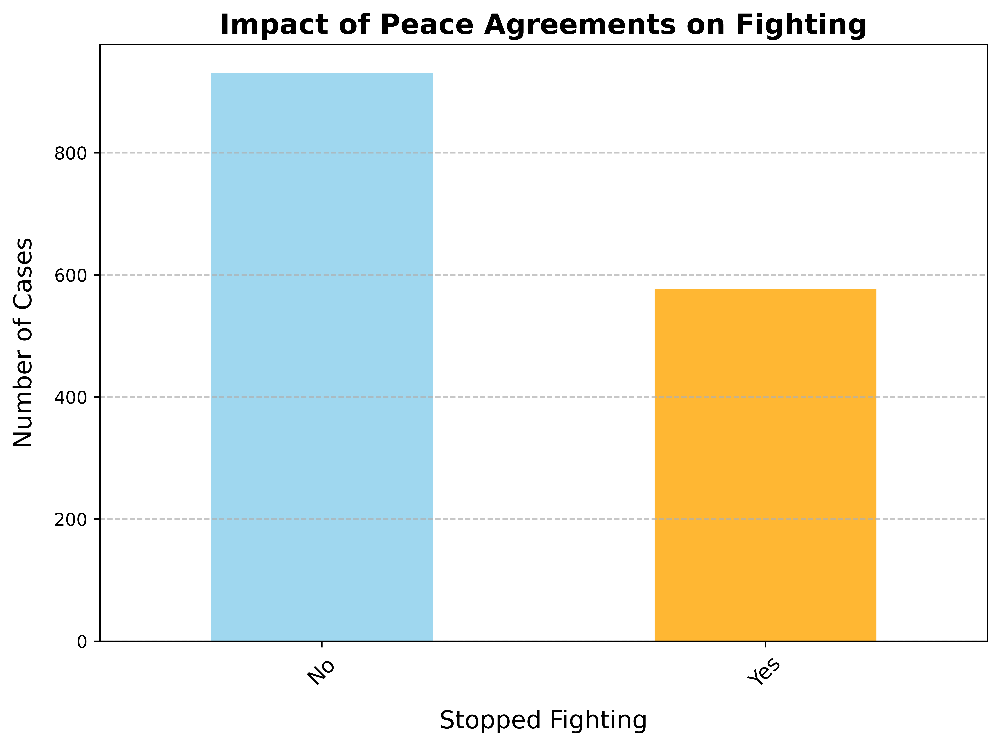

In [25]:
fig, ax = plt.subplots(figsize=(8, 6), dpi=1000)

# Plotting the bar chart
pax['end'].value_counts().sort_index().plot(
    kind='bar',
    color=['skyblue', 'orange'],
    alpha=0.8,
    ax=ax
)

# Setting titles and labels
ax.set_title("Impact of Peace Agreements on Fighting", fontsize=16, fontweight='bold')
ax.set_xlabel("Stopped Fighting", fontsize=14, labelpad=10)
ax.set_ylabel("Number of Cases", fontsize=14, labelpad=10)

# Setting x-axis ticks and labels
ax.set_xticks([0, 1])  
ax.set_xticklabels(["No", "Yes"], fontsize=12, rotation=45)

# Adding gridlines
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Adjusting layout and showing the plot
plt.tight_layout()
plt.show()

In [26]:
target = "end"


features_for_viz=[
    ("ter", "Conflict Type: Territory"),
    ("gov", "Conflict Type: Government"),
    ("inter", "Interstate Conflict"),
    ("inter_intra", "Mixed Conflict"),
    ("intra", "Intrastate Conflict"),
    ("stage_cea", "Stage: Ceasefire"),
    ("stage_pre", "Stage: Pre-negotiation"),
    ("stage_ren", "Stage: Renewal"),
    ("stage_subcomp", "Stage: Comprehensive"),
    ("stage_subpar", "Stage: Partial"),
    ("GRa", "Groups: Racial-Ethnic groups"),
    ("GRe", "Groups: Religious Groups"),
    ("GRef", "Groups: Refugees-Displaced Persons"),
    ("GeWom", "Gender: Women"),
    ("Pol", "Governance: Political Institutions"),
    ("Ele", "Governance: Elections"),
    ("ConGen", "Governance: Constitutional Modification"),
    ("ps", "Powersharing"),
    ("HrCp", "Human Rights: Civil and Political"),
    ("HrDem", "Human Rights: Democracy"),
    ("Prot", "Human Rights: Protections"),
    ("JusCr", "Justice Reform: Criminal"),
    ("JusJu", "Justice Reform: Judiciary and Courts"),
    ("Dev", "Reconstruction: Development"),
    ("IntFu", "Reconstruction: International Funds"),
    ("SsrGua", "Security: Guarantees"),
    ("Ce", "Security: Ceasefire"),
    ("SsrPol", "Security: Police"),
    ("SsrArm", "Security: Armed Forces"),
    ("SsrDdr", "Security: Demilitarisation, Disarmament, Demobilisation"),
    ("SsrPsf", "Security: Rebel Forces"),
    ("SsrFf", "Security: Withdrawal of Foreign Forces"),
    ("TjAm", "Transitional Justice: Amnesty"),
    ("TjPrire", "Transitional Justice: Prisoner Release"),
    ("TjRep", "Transitional Justice: Reparations"),
    ("TjNR", "Transitional Justice: Reconciliation"),
    ("ImUN", "Implementation: UN Signatory"),
    ("ImPK", "Implementation: International Mission"),
    ("ImE", "Implementation: Enforcement Mechanism"),
]


# Plot configuration for bivariate relationships
n_cols = 5
n_rows = -(-len(features_for_viz) // n_cols)  # Ceiling division

fig, axes = plt.subplots(n_rows, n_cols, figsize=(40, 4 * n_rows), dpi=600)
axes = axes.flatten()

for i, (feature, label) in enumerate(features_for_viz):
    ax = axes[i]
    try:
        # Crosstab for feature and target
        ctab = pd.crosstab(pax[feature], pax[target], normalize='index') * 100
        ctab.plot(kind='bar', stacked=True, ax=ax, color=['skyblue', 'orange'], alpha=0.8)
        ax.set_title(label, fontsize=14)
        ax.set_xlabel("Provisions", fontsize=12)
        ax.set_ylabel("Percentage", fontsize=12)
        ax.legend(title='Stopped', fontsize=10)
        ax.set_xticklabels(["No", "Yes"], fontsize=12, rotation=45)
        ax.grid(axis='y', linestyle='--', alpha=0.7)
    except Exception as e:
        ax.axis('off')
        print(f"Could not plot {feature}: {e}")

# Remove unused axes
for j in range(len(features_for_viz), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

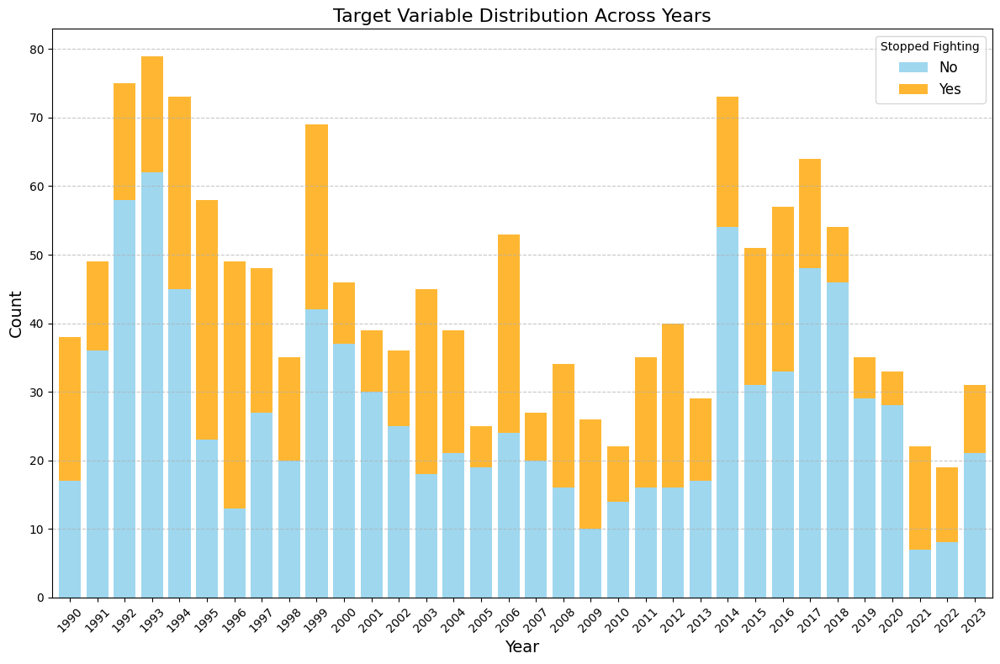

In [27]:
# Group data by year and target variable
target_year_counts = pax.groupby("year")[target].value_counts().unstack()

# Plot target distribution across years (stacked bar chart)
bar_width = 0.8  # Width of the bars
ax = target_year_counts.plot(
    kind="bar",
    figsize=(12, 8),
    stacked=True,
    width=bar_width,
    color=['skyblue', 'orange'],
    alpha=0.8
)

# Ensure the index (years) is correctly handled for the line graphs
years = target_year_counts.index



# Add title and axis labels
plt.title("Target Variable Distribution Across Years", fontsize=16)
plt.xlabel("Year", fontsize=14)
plt.ylabel("Count", fontsize=14)
plt.xticks(rotation=45)  # Rotate x-axis labels

# Add a custom legend
handles, labels = ax.get_legend_handles_labels()
bar_handles = handles[:2]  # First two handles for the bars
line_handles = handles[2:]  # Last two handles for the lines

# Merge bar and line legends
plt.legend(
    bar_handles + line_handles,
    ["No", "Yes", "No", "Yes"],
    title="Stopped Fighting",
    fontsize=12
)

# Add gridlines for readability
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Adjust layout and show plot
plt.tight_layout()
plt.show()

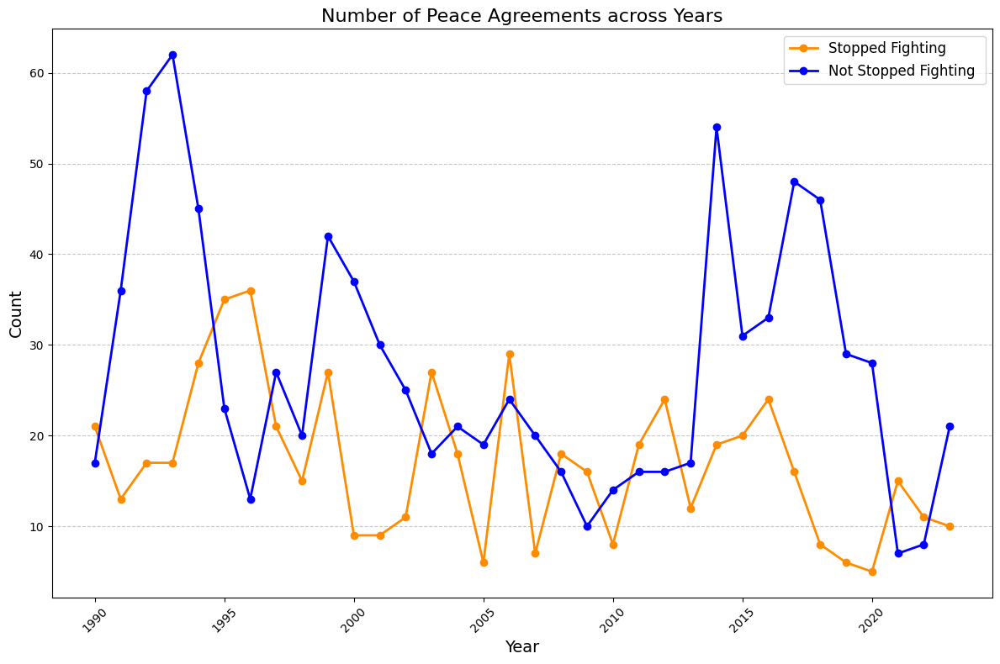

In [28]:
years = target_year_counts.index
yes_counts = target_year_counts[1.0]  
no_counts = target_year_counts[0.0]  

# Create the line graph
plt.figure(figsize=(12, 8))

# Plot line for ep_end == 1
plt.plot(
    years,
    yes_counts,
    color='darkorange',
    marker='o',
    linestyle='-',
    linewidth=2,
    label='Stopped Fighting'
)

# Plot line for ep_end == 0
plt.plot(
    years,
    no_counts,
    color='blue',
    marker='o',
    linestyle='-',
    linewidth=2,
    label='Not Stopped Fighting '
)

# Add title and labels
plt.title("Number of Peace Agreements across Years", fontsize=16)
plt.xlabel("Year", fontsize=14)
plt.ylabel("Count", fontsize=14)
plt.xticks(rotation=45)  # Rotate x-axis labels

# Add legend
plt.legend(fontsize=12)

# Add gridlines
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()


## Machine Learning Classification 

In [29]:
# Combine features and target into a single list for checking missing values
columns_to_check = features + ["end"]

# Count the number of missing values in each column
missing_values = pax[columns_to_check].isnull().sum()

# Display the results
print("Number of missing values for each column:")
print(missing_values)

Number of missing values for each column:
ter                0
gov                0
inter              0
inter_intra        0
intra              0
stage_cea          0
stage_pre          0
stage_ren          0
stage_subcomp      0
stage_subpar       0
GRa                0
GRe                0
GRef               0
GeWom              0
Pol                0
Ele                0
ConGen             0
ps                 0
HrCp               0
HrDem              0
Prot               0
JusCr              0
JusJu              0
Dev                0
IntFu              0
SsrGua             0
Ce                 0
SsrPol             0
SsrArm             0
SsrDdr             0
SsrPsf             0
SsrFf              0
TjAm               0
TjPrire            0
TjRep              0
TjNR               0
ImUN               0
ImPK               0
ImE                0
end              547
dtype: int64


In [30]:
pax_clean= pax.dropna(subset=columns_to_check)

In [31]:
X = pax_clean[features]
y = pax_clean['end']

In [32]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [33]:
print(len(y_test))
print(len(y_train))

377
1131



Training Logistic Regression

Logistic Regression Results:
Accuracy: 0.86
Confusion Matrix:
[[220  11]
 [ 43 103]]
Classification Report:
              precision    recall  f1-score   support

         0.0       0.84      0.95      0.89       231
         1.0       0.90      0.71      0.79       146

    accuracy                           0.86       377
   macro avg       0.87      0.83      0.84       377
weighted avg       0.86      0.86      0.85       377



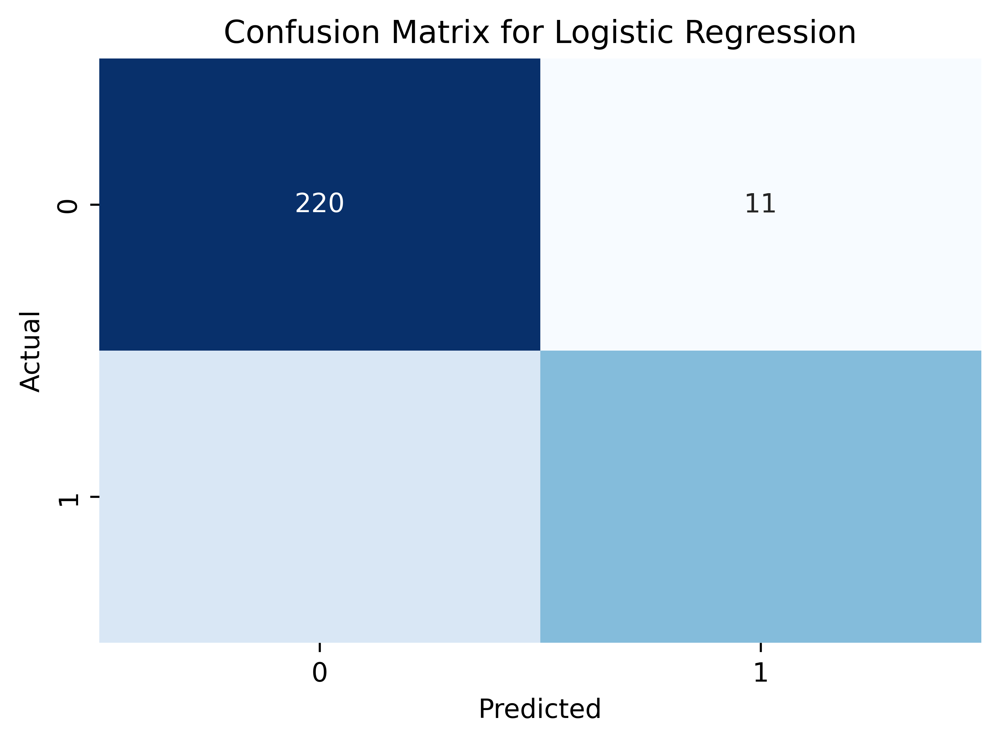


Training Random Forest

Random Forest Results:
Accuracy: 0.84
Confusion Matrix:
[[210  21]
 [ 39 107]]
Classification Report:
              precision    recall  f1-score   support

         0.0       0.84      0.91      0.88       231
         1.0       0.84      0.73      0.78       146

    accuracy                           0.84       377
   macro avg       0.84      0.82      0.83       377
weighted avg       0.84      0.84      0.84       377



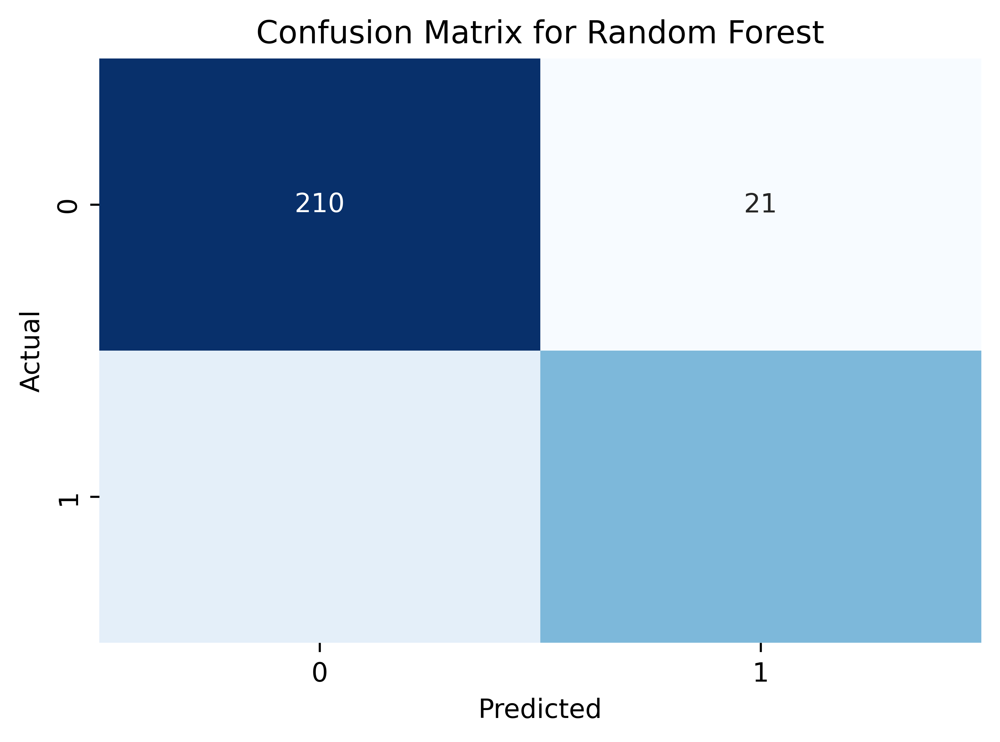


Training Gradient Boosting

Gradient Boosting Results:
Accuracy: 0.85
Confusion Matrix:
[[218  13]
 [ 44 102]]
Classification Report:
              precision    recall  f1-score   support

         0.0       0.83      0.94      0.88       231
         1.0       0.89      0.70      0.78       146

    accuracy                           0.85       377
   macro avg       0.86      0.82      0.83       377
weighted avg       0.85      0.85      0.84       377



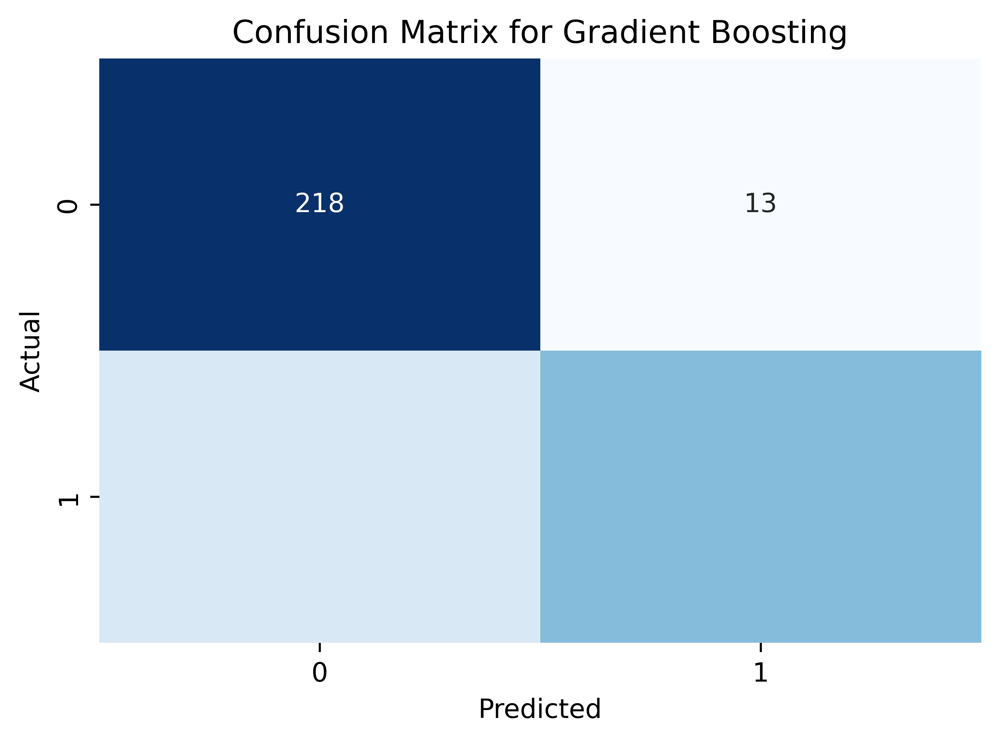


Training XGBoost

XGBoost Results:
Accuracy: 0.86
Confusion Matrix:
[[210  21]
 [ 33 113]]
Classification Report:
              precision    recall  f1-score   support

         0.0       0.86      0.91      0.89       231
         1.0       0.84      0.77      0.81       146

    accuracy                           0.86       377
   macro avg       0.85      0.84      0.85       377
weighted avg       0.86      0.86      0.86       377



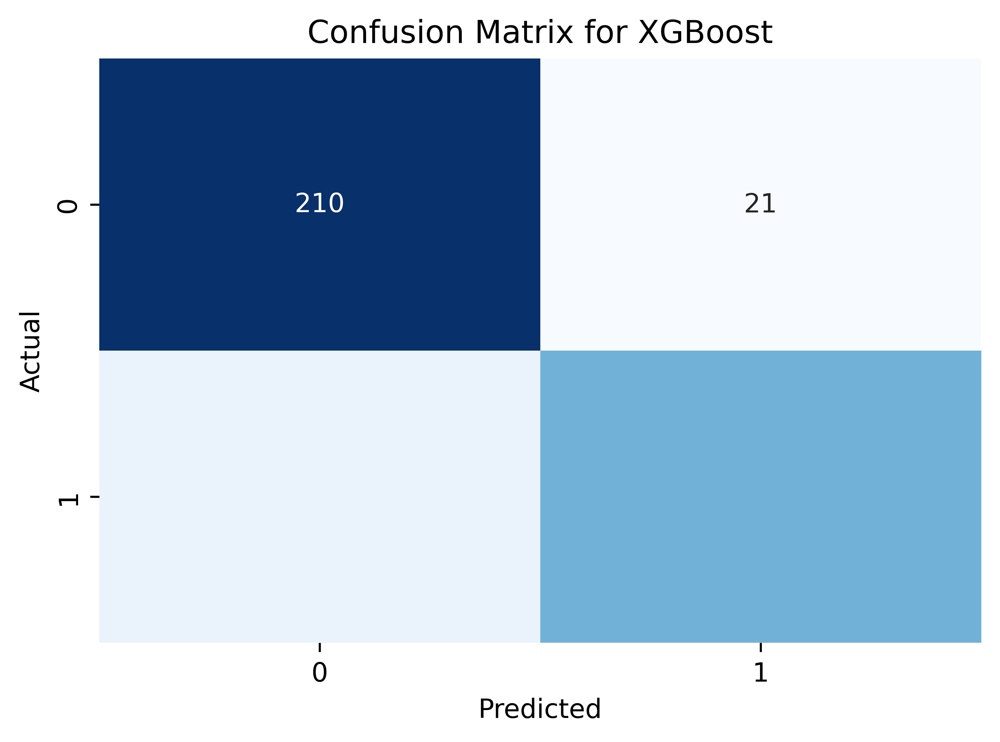


Training Support Vector Classifier

Support Vector Classifier Results:
Accuracy: 0.87
Confusion Matrix:
[[228   3]
 [ 46 100]]
Classification Report:
              precision    recall  f1-score   support

         0.0       0.83      0.99      0.90       231
         1.0       0.97      0.68      0.80       146

    accuracy                           0.87       377
   macro avg       0.90      0.84      0.85       377
weighted avg       0.89      0.87      0.86       377



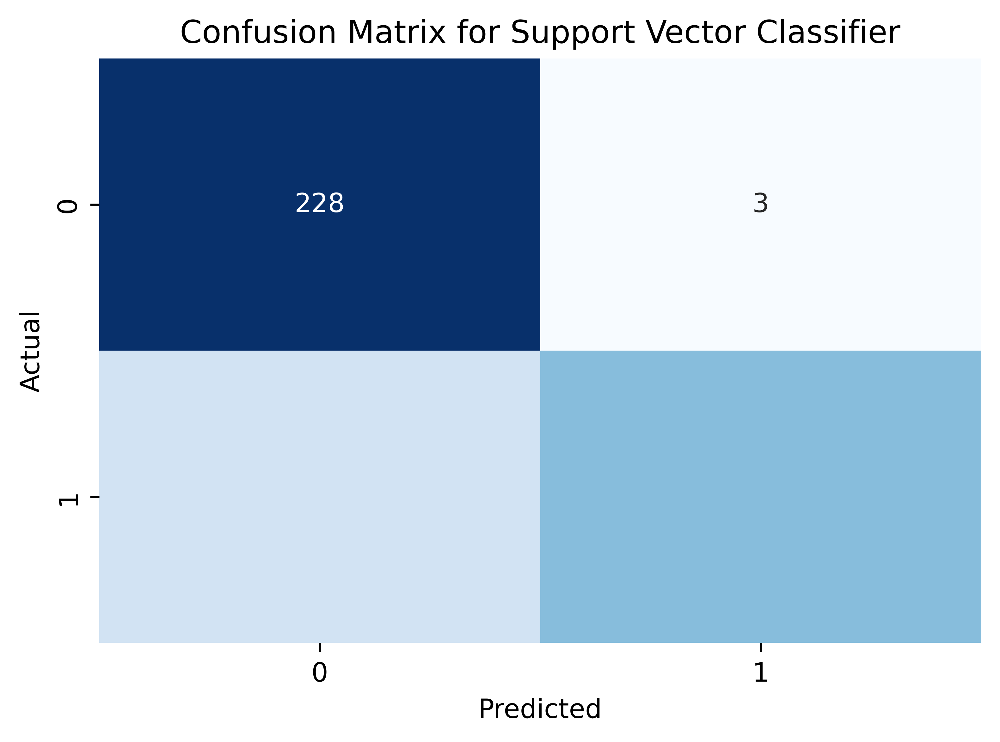


Training Decision Tree

Decision Tree Results:
Accuracy: 0.78
Confusion Matrix:
[[186  45]
 [ 37 109]]
Classification Report:
              precision    recall  f1-score   support

         0.0       0.83      0.81      0.82       231
         1.0       0.71      0.75      0.73       146

    accuracy                           0.78       377
   macro avg       0.77      0.78      0.77       377
weighted avg       0.79      0.78      0.78       377



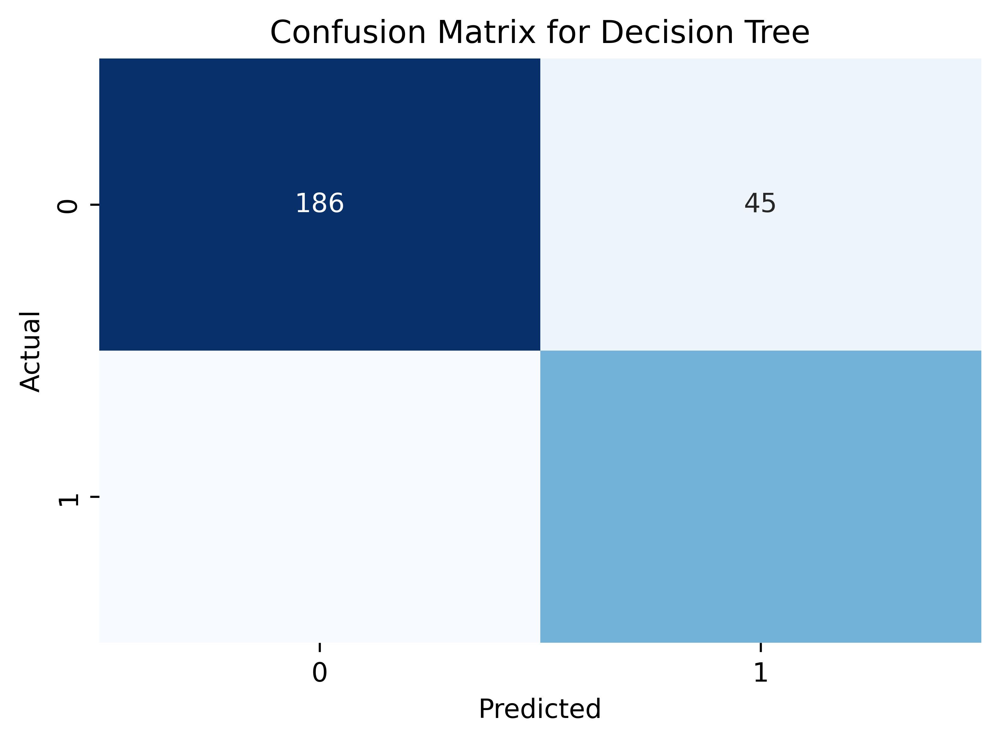


Training K-Nearest Neighbors

K-Nearest Neighbors Results:
Accuracy: 0.78
Confusion Matrix:
[[200  31]
 [ 51  95]]
Classification Report:
              precision    recall  f1-score   support

         0.0       0.80      0.87      0.83       231
         1.0       0.75      0.65      0.70       146

    accuracy                           0.78       377
   macro avg       0.78      0.76      0.76       377
weighted avg       0.78      0.78      0.78       377



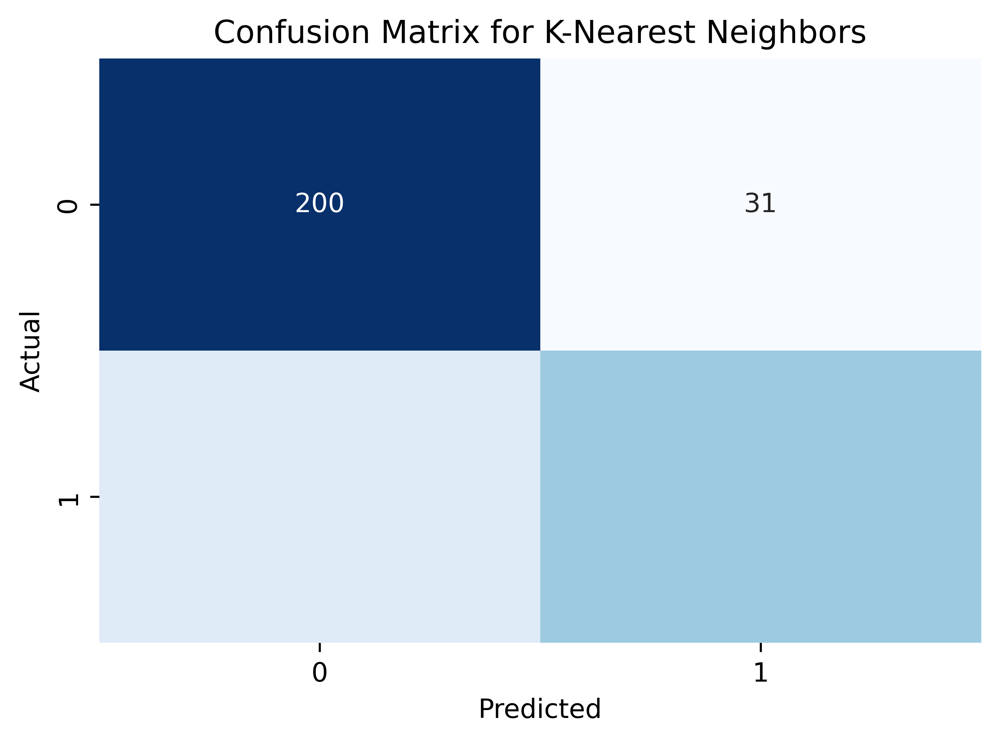


Training Naive Bayes

Naive Bayes Results:
Accuracy: 0.76
Confusion Matrix:
[[198  33]
 [ 59  87]]
Classification Report:
              precision    recall  f1-score   support

         0.0       0.77      0.86      0.81       231
         1.0       0.72      0.60      0.65       146

    accuracy                           0.76       377
   macro avg       0.75      0.73      0.73       377
weighted avg       0.75      0.76      0.75       377



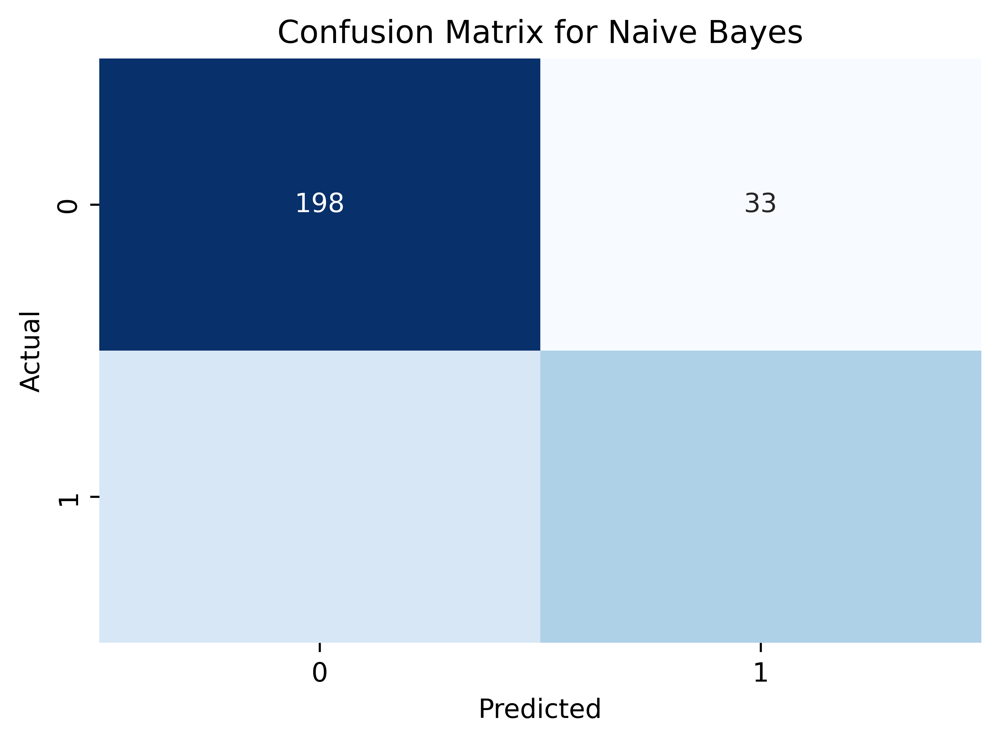


Training Neural Network (MLP)

Neural Network (MLP) Results:
Accuracy: 0.83
Confusion Matrix:
[[199  32]
 [ 33 113]]
Classification Report:
              precision    recall  f1-score   support

         0.0       0.86      0.86      0.86       231
         1.0       0.78      0.77      0.78       146

    accuracy                           0.83       377
   macro avg       0.82      0.82      0.82       377
weighted avg       0.83      0.83      0.83       377



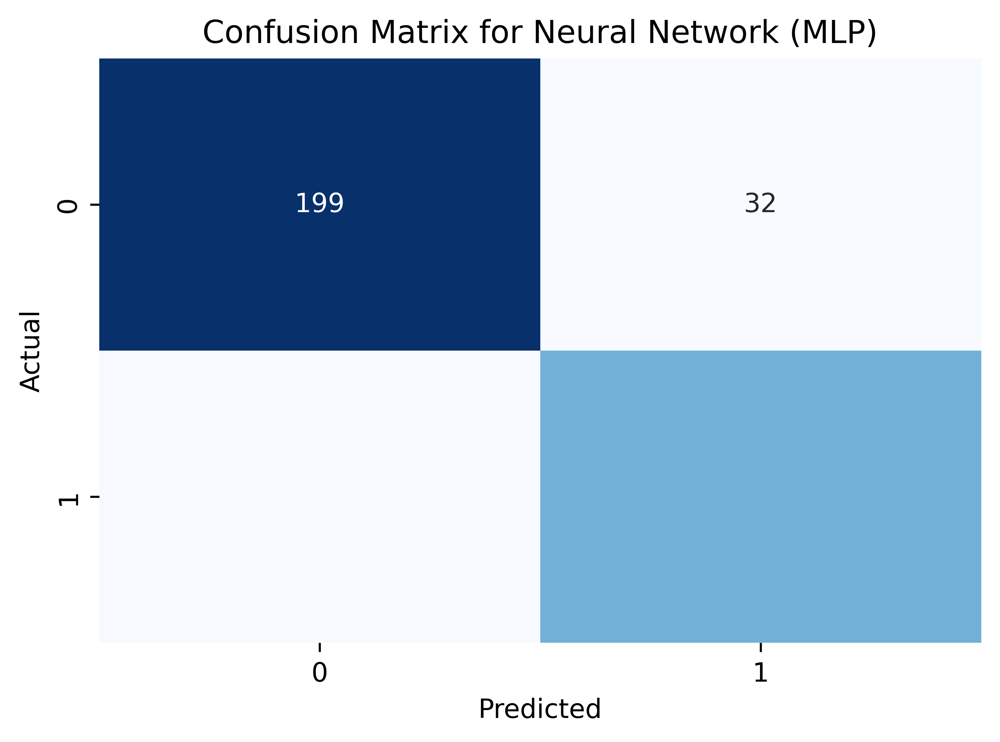


Training AdaBoost

AdaBoost Results:
Accuracy: 0.87
Confusion Matrix:
[[222   9]
 [ 40 106]]
Classification Report:
              precision    recall  f1-score   support

         0.0       0.85      0.96      0.90       231
         1.0       0.92      0.73      0.81       146

    accuracy                           0.87       377
   macro avg       0.88      0.84      0.86       377
weighted avg       0.88      0.87      0.87       377



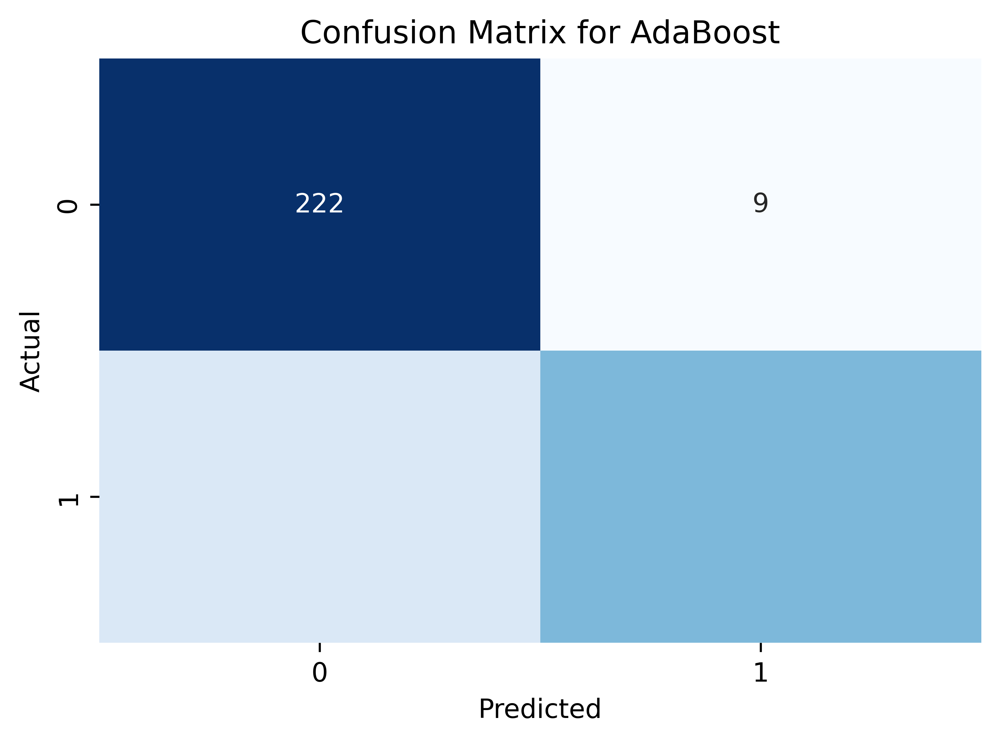


Training Bagging

Bagging Results:
Accuracy: 0.84
Confusion Matrix:
[[210  21]
 [ 41 105]]
Classification Report:
              precision    recall  f1-score   support

         0.0       0.84      0.91      0.87       231
         1.0       0.83      0.72      0.77       146

    accuracy                           0.84       377
   macro avg       0.83      0.81      0.82       377
weighted avg       0.84      0.84      0.83       377



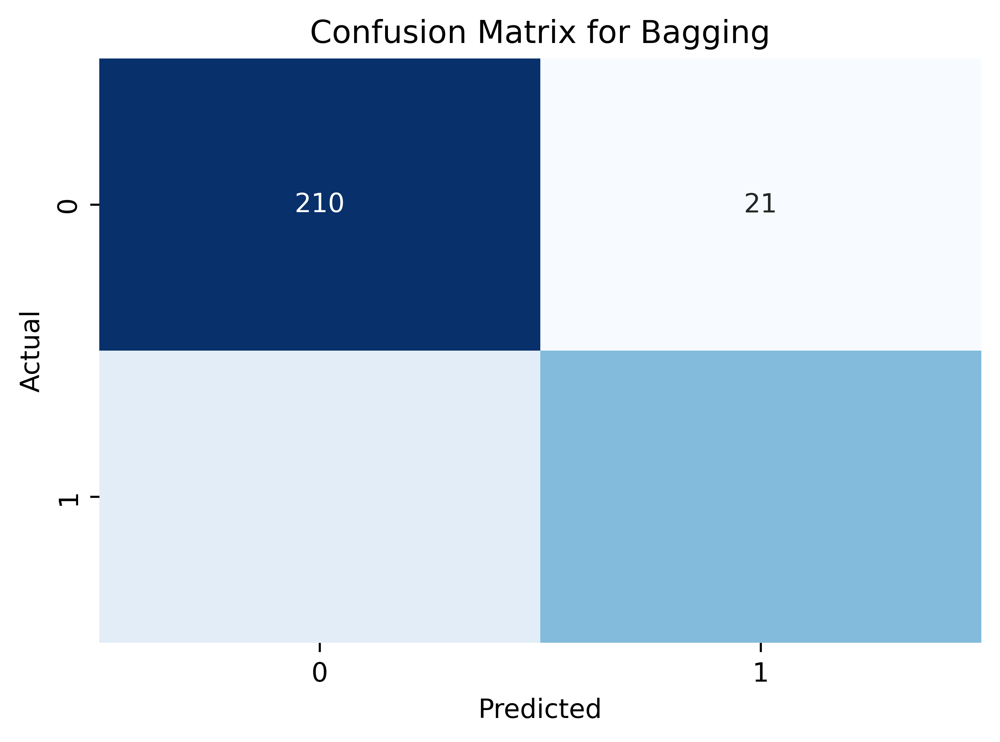


Training HistGradientBoosting

HistGradientBoosting Results:
Accuracy: 0.84
Confusion Matrix:
[[212  19]
 [ 40 106]]
Classification Report:
              precision    recall  f1-score   support

         0.0       0.84      0.92      0.88       231
         1.0       0.85      0.73      0.78       146

    accuracy                           0.84       377
   macro avg       0.84      0.82      0.83       377
weighted avg       0.84      0.84      0.84       377



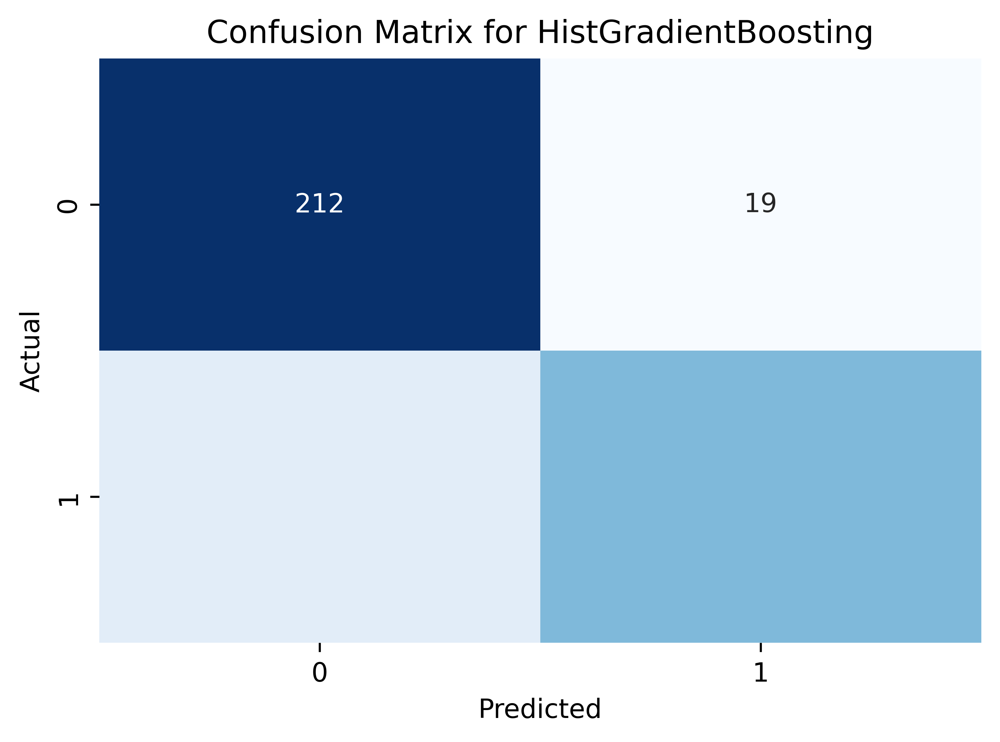


Training Linear Discriminant Analysis

Linear Discriminant Analysis Results:
Accuracy: 0.87
Confusion Matrix:
[[229   2]
 [ 48  98]]
Classification Report:
              precision    recall  f1-score   support

         0.0       0.83      0.99      0.90       231
         1.0       0.98      0.67      0.80       146

    accuracy                           0.87       377
   macro avg       0.90      0.83      0.85       377
weighted avg       0.89      0.87      0.86       377



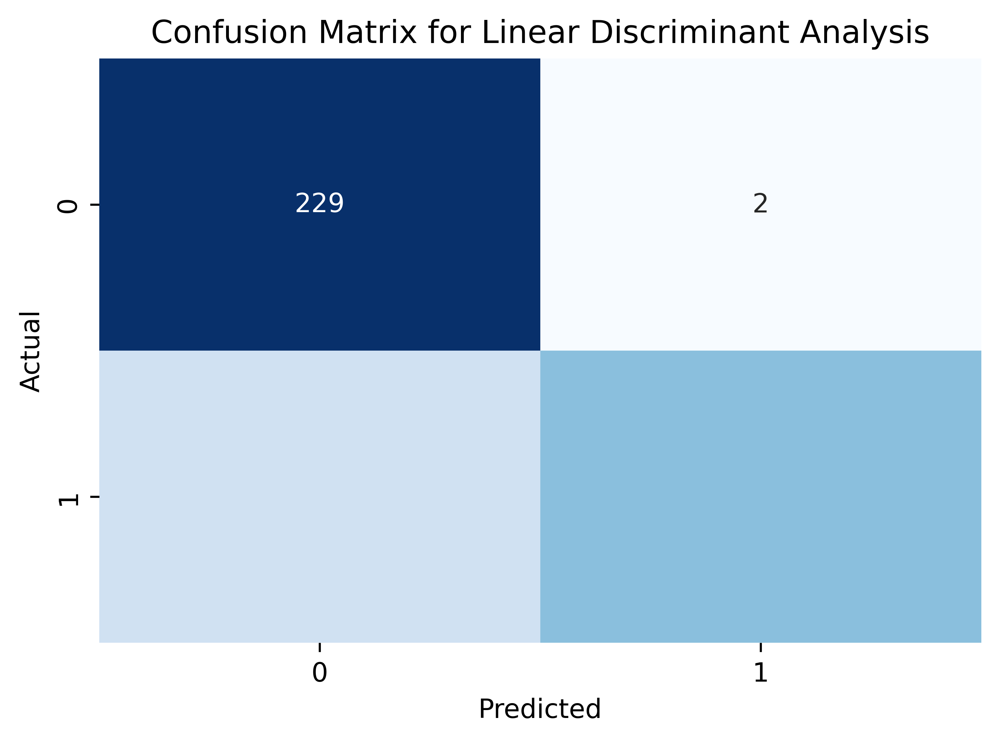

In [34]:
### this is quick way of running base classifiers
### loop grabs each classifier from dictionary(key: value), train, predict on test, plot CM


classifiers = {
    'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'XGBoost': XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42),
    'Support Vector Classifier': SVC(kernel='rbf', random_state=42, gamma='scale', C=1.0),
    #'Linear SVM': LinearSVC(max_iter=10000, random_state=42),
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'K-Nearest Neighbors': KNeighborsClassifier(),
    'Naive Bayes': GaussianNB(),
    'Neural Network (MLP)': MLPClassifier(random_state=42, max_iter=1000),
    'AdaBoost': AdaBoostClassifier(random_state=42),
    'Bagging': BaggingClassifier(random_state=42),
    'HistGradientBoosting': HistGradientBoostingClassifier(random_state=42),
    'Linear Discriminant Analysis': LinearDiscriminantAnalysis()
}


for name, clf in classifiers.items():
    print(f'\nTraining {name}')
    clf.fit(X_train, y_train)        ### Train model
    y_pred = clf.predict(X_test)     ### Predict on test set

    ### obtain evaluation metrics
    accuracy = accuracy_score(y_test, y_pred)
    conf_matrix = confusion_matrix(y_test, y_pred)
    report = classification_report(y_test, y_pred)

    print(f'\n{name} Results:')
    print(f'Accuracy: {accuracy:.2f}')
    print('Confusion Matrix:')
    print(conf_matrix)
    print('Classification Report:')
    print(report)

    ### finally plot confusion matrix
    plt.figure(figsize=(6, 4), dpi=600)  ### added higher dpi for better viz
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.title(f'Confusion Matrix for {name}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()


Training Logistic Regression

Training Random Forest

Training Gradient Boosting

Training XGBoost

Training Support Vector Classifier

Training Decision Tree

Training K-Nearest Neighbors

Training Naive Bayes

Training Neural Network (MLP)

Training AdaBoost

Training Bagging

Training HistGradientBoosting

Training Linear Discriminant Analysis


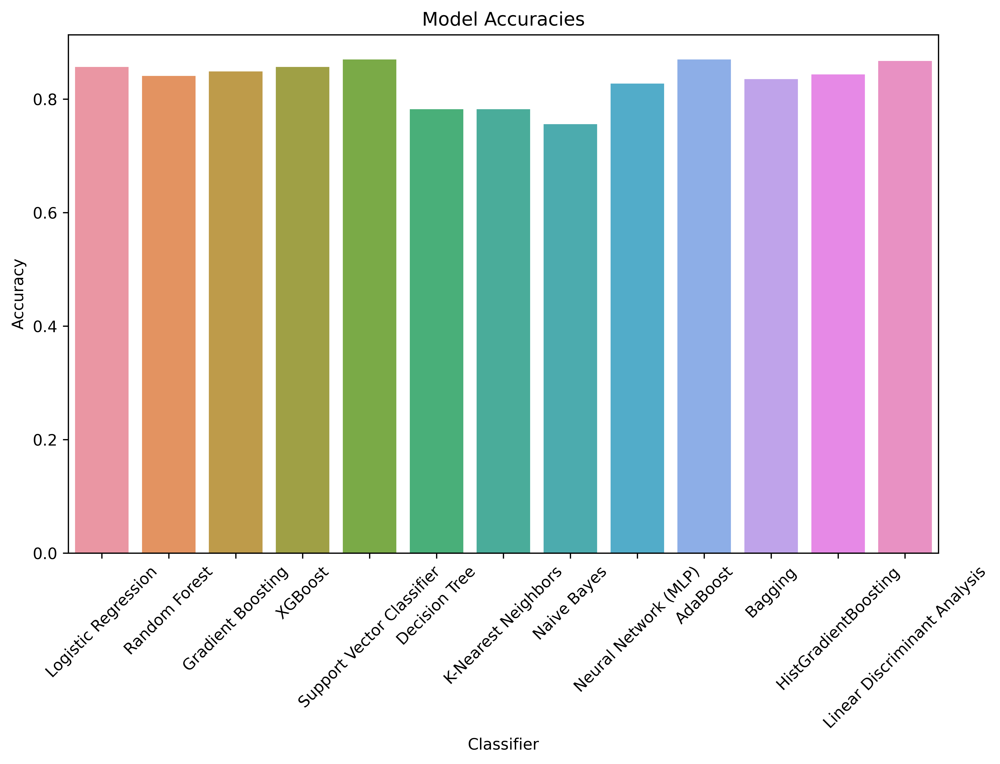

In [35]:
### Dictionary to store accuracy results
accuracy_results = {}

for name, clf in classifiers.items():
    print(f'\nTraining {name}')
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    accuracy_results[name] = accuracy

    conf_matrix = confusion_matrix(y_test, y_pred)
    report = classification_report(y_test, y_pred)





### plot accuracies as bar plot
plt.figure(figsize=(10, 6), dpi=600)
sns.barplot(x=list(accuracy_results.keys()), y=list(accuracy_results.values()))
plt.title('Model Accuracies')
plt.xlabel('Classifier')
plt.ylabel('Accuracy')
plt.xticks(rotation=45)
plt.show()

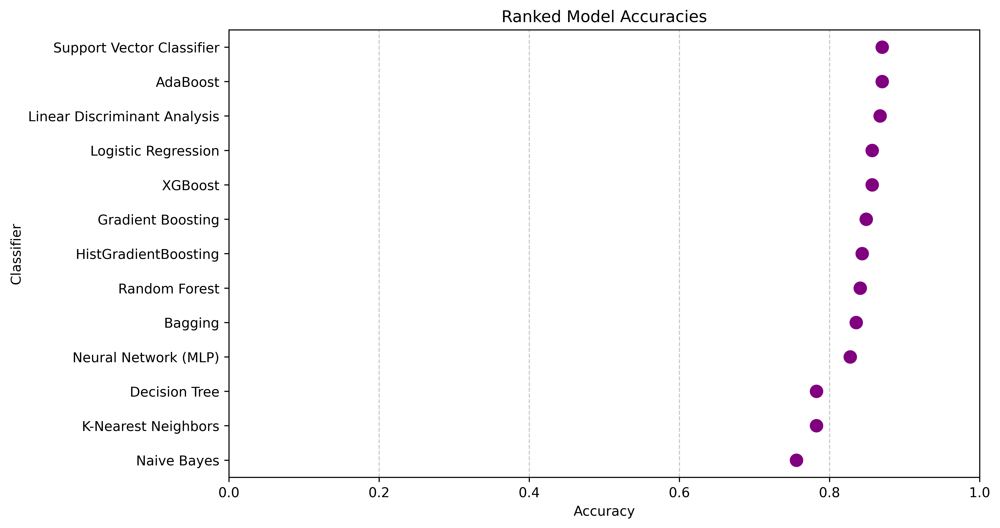

In [36]:
### ranking these models based on their accuracy
plt.figure(figsize=(10, 6), dpi=600)
sorted_results = sorted(accuracy_results.items(), key=lambda x: x[1], reverse=True)
sns.stripplot(
    x=[item[1] for item in sorted_results],
    y=[item[0] for item in sorted_results],
    size=10, color='purple'
)
plt.title('Ranked Model Accuracies')
plt.xlabel('Accuracy')
plt.ylabel('Classifier')
plt.xlim(0, 1)
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

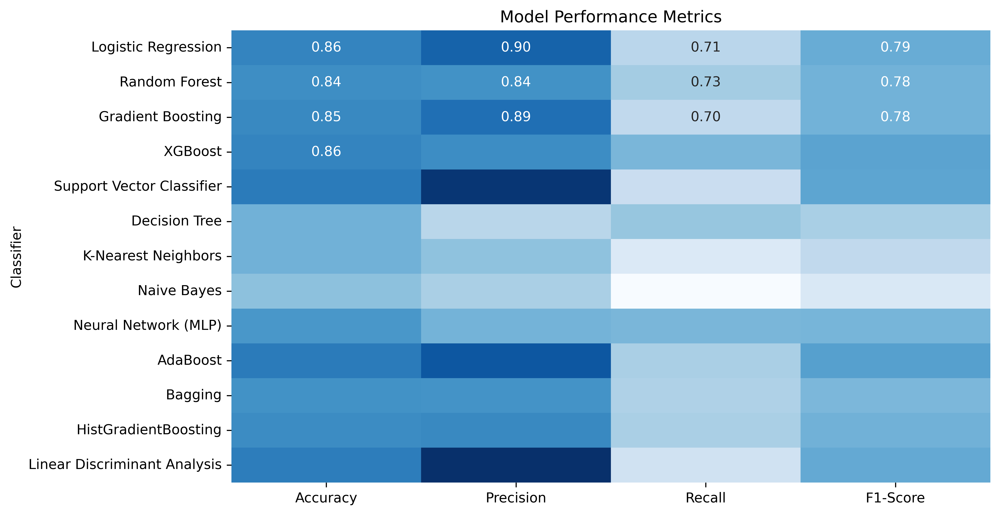

In [37]:
### we should include this in slides as it provides other metrics as well

### obtain metrics from models
metrics_results = {
    "Classifier": list(accuracy_results.keys()),
    "Accuracy": list(accuracy_results.values()),
    "Precision": [precision_score(y_test, clf.predict(X_test)) for clf in classifiers.values()],
    "Recall": [recall_score(y_test, clf.predict(X_test)) for clf in classifiers.values()],
    "F1-Score": [f1_score(y_test, clf.predict(X_test)) for clf in classifiers.values()]
}

### Convert to DataFrame and plot heatmap
metrics_df = pd.DataFrame(metrics_results).set_index("Classifier")
plt.figure(figsize=(10, 6), dpi=600)
sns.heatmap(metrics_df, annot=True, fmt=".2f", cmap="Blues", cbar=False)
plt.title('Model Performance Metrics')
plt.show()

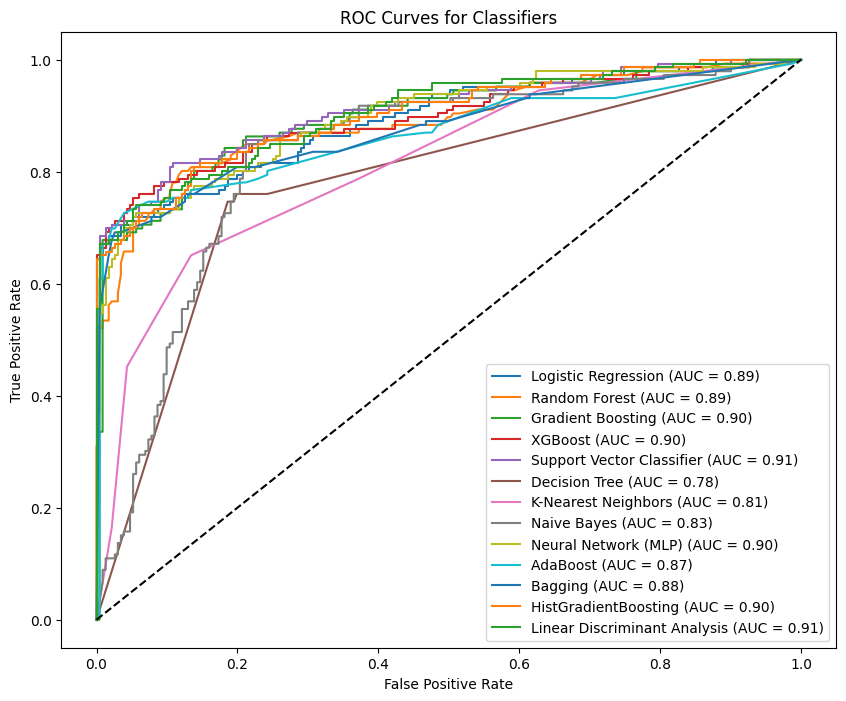

In [38]:
### AUC for classifiers
plt.figure(figsize=(10, 8))

for name, clf in classifiers.items():
    clf.fit(X_train, y_train)
    if hasattr(clf, "predict_proba"):
        y_score = clf.predict_proba(X_test)[:, 1]
    else:
        y_score = clf.decision_function(X_test)

    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for Classifiers')
plt.legend(loc='lower right')
plt.show()


Tuning hyperparameters for Logistic Regression...
Best parameters for Logistic Regression: {'C': 1, 'solver': 'liblinear'}

Tuning hyperparameters for Random Forest...
Best parameters for Random Forest: {'max_depth': 20, 'min_samples_split': 2, 'n_estimators': 200}

Tuning hyperparameters for Gradient Boosting...
Best parameters for Gradient Boosting: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 50}

Tuning hyperparameters for XGBoost...
Best parameters for XGBoost: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 50}

Tuning hyperparameters for Support Vector Classifier...
Best parameters for Support Vector Classifier: {'C': 0.1, 'gamma': 'scale', 'kernel': 'linear'}

Tuning hyperparameters for Linear SVM...
Best parameters for Linear SVM: {'C': 1, 'penalty': 'l2'}

Tuning hyperparameters for Decision Tree...
Best parameters for Decision Tree: {'max_depth': 10, 'min_samples_split': 10}

Tuning hyperparameters for K-Nearest Neighbors...
Best parameters for K-Nearest Ne

/Users/namigabbasov/anaconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:516: FitFailedWarning: 
5 fits failed out of a total of 20.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/namigabbasov/anaconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py", line 859, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/namigabbasov/anaconda3/lib/python3.11/site-packages/sklearn/base.py", line 1365, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/namigabbasov/anaconda3/lib/python3.11/site-packages/sklear

HistGradientBoosting Accuracy: 0.8753
Linear Discriminant Analysis Accuracy: 0.8674


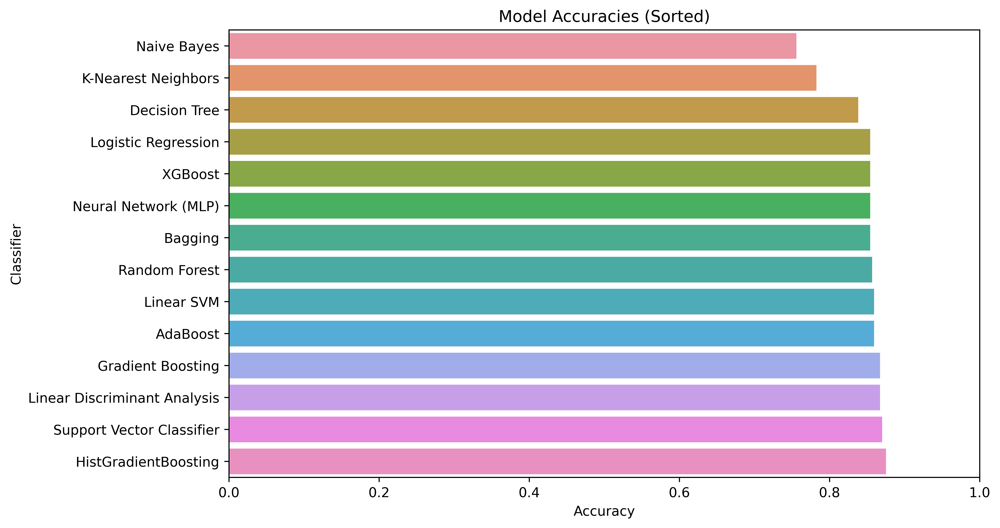

In [39]:
classifiers = {
    'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'XGBoost': XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42),
    'Support Vector Classifier': SVC(),
    'Linear SVM': LinearSVC(max_iter=10000, random_state=42),
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'K-Nearest Neighbors': KNeighborsClassifier(),
    'Naive Bayes': GaussianNB(),
    'Neural Network (MLP)': MLPClassifier(random_state=42, max_iter=1000),
    'AdaBoost': AdaBoostClassifier(random_state=42),
    'Bagging': BaggingClassifier(random_state=42),
    'HistGradientBoosting': HistGradientBoostingClassifier(random_state=42),
    'Linear Discriminant Analysis': LinearDiscriminantAnalysis()
}

### hyperparameter grids to check
param_grids = {
    'Logistic Regression': {
        'C': [0.01, 0.1, 1, 10],
        'solver': ['lbfgs', 'liblinear']
    },
    'Random Forest': {
        'n_estimators': [50, 100, 200],
        'max_depth': [None, 10, 20],
        'min_samples_split': [2, 5, 10]
    },
    'Gradient Boosting': {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 10]
    },
    'XGBoost': {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 10]
    },
    'Support Vector Classifier': {
        'C': [0.1, 1, 10],
        'kernel': ['linear', 'rbf'],
        'gamma': ['scale', 'auto']
    },
    'Linear SVM': {
        'C': [0.1, 1, 10],
        'penalty': ['l2']
    },
    'Decision Tree': {
        'max_depth': [None, 10, 20],
        'min_samples_split': [2, 5, 10]
    },
    'K-Nearest Neighbors': {
        'n_neighbors': [3, 5, 7],
        'weights': ['uniform', 'distance']
    },
    'Neural Network (MLP)': {
        'hidden_layer_sizes': [(50,), (100,), (50, 50)],
        'activation': ['relu', 'tanh'],
        'solver': ['adam', 'sgd'],
        'learning_rate': ['constant', 'adaptive']
    },
    'AdaBoost': {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 1]
    },
    'Bagging': {
        'n_estimators': [10, 50, 100],
        'max_samples': [0.5, 0.8, 1.0]
    },
    'HistGradientBoosting': {
        'learning_rate': [0.01, 0.1, 0.2],
        'max_iter': [100, 200],
        'max_depth': [None, 10, 20]
    },
    'Linear Discriminant Analysis': {
        'solver': ['svd', 'lsqr'],
        'shrinkage': [None, 'auto']
    }
}

### dictionary to store best classifiers
best_classifiers = {}

### perform hyperparameter tuning
for name, clf in classifiers.items():
    if name in param_grids:
        print(f'\nTuning hyperparameters for {name}...')
        grid_search = GridSearchCV(clf, param_grids[name], cv=5, scoring='accuracy', n_jobs=-1)
        grid_search.fit(X_train, y_train)
        best_classifiers[name] = grid_search.best_estimator_
        print(f'Best parameters for {name}: {grid_search.best_params_}')
    else:
        print(f'\nNo hyperparameter tuning for {name}, using default settings.')
        best_classifiers[name] = clf
        best_classifiers[name].fit(X_train, y_train)

### evaluate all models
accuracy_results = {}
for name, model in best_classifiers.items():
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    accuracy_results[name] = accuracy
    print(f'{name} Accuracy: {accuracy:.4f}')

### Visualize accuracies
sorted_results = sorted(accuracy_results.items(), key=lambda x: x[1])
sorted_keys = [item[0] for item in sorted_results]
sorted_values = [item[1] for item in sorted_results]

plt.figure(figsize=(10, 6), dpi=600)
sns.barplot(x=sorted_values, y=sorted_keys, orient='h')
plt.title('Model Accuracies (Sorted)')
plt.xlabel('Accuracy')
plt.ylabel('Classifier')
plt.xlim(0, 1)
plt.show()

                              Accuracy  Precision    Recall  F1-Score
Classifier                                                           
Logistic Regression           0.854111   0.895652  0.705479  0.789272
Random Forest                 0.856764   0.859375  0.753425  0.802920
Gradient Boosting             0.867374   0.887097  0.753425  0.814815
XGBoost                       0.854111   0.876033  0.726027  0.794007
Support Vector Classifier     0.870027   0.989899  0.671233  0.800000
Linear SVM                    0.859416   0.926606  0.691781  0.792157
Decision Tree                 0.838196   0.814815  0.753425  0.782918
K-Nearest Neighbors           0.782493   0.753968  0.650685  0.698529
Naive Bayes                   0.755968   0.725000  0.595890  0.654135
Neural Network (MLP)          0.854111   0.888889  0.712329  0.790875
AdaBoost                      0.859416   0.911504  0.705479  0.795367
Bagging                       0.854111   0.869919  0.732877  0.795539
HistGradientBoosting

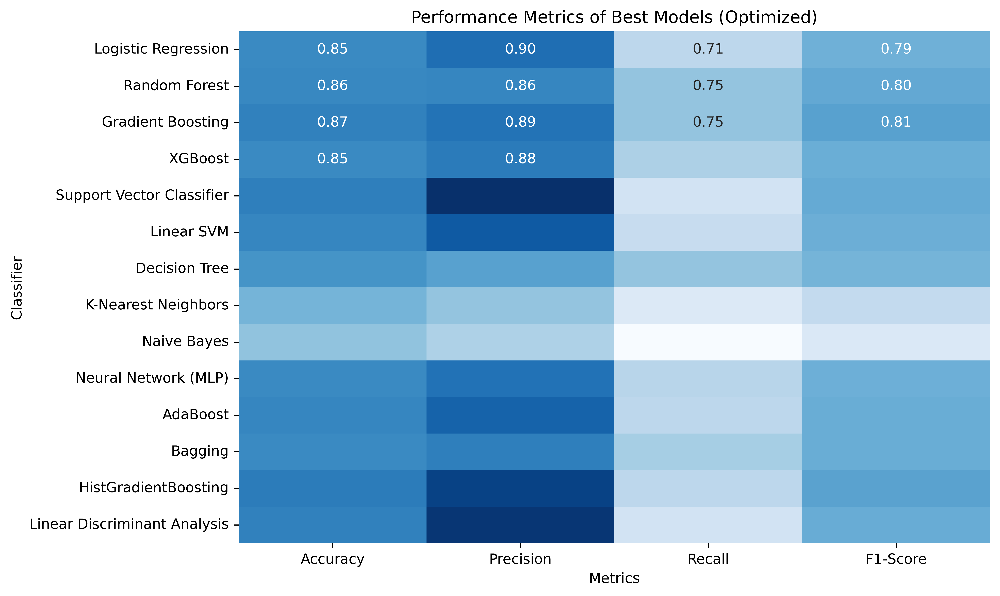

In [40]:
### Viz of Metrics from optimized best classifiers


### compute metrics for best models after optimization
metrics_results = {
    "Classifier": list(best_classifiers.keys()),
    "Accuracy": [accuracy_score(y_test, model.predict(X_test)) for model in best_classifiers.values()],
    "Precision": [precision_score(y_test, model.predict(X_test), zero_division=0) for model in best_classifiers.values()],
    "Recall": [recall_score(y_test, model.predict(X_test), zero_division=0) for model in best_classifiers.values()],
    "F1-Score": [f1_score(y_test, model.predict(X_test), zero_division=0) for model in best_classifiers.values()]
}

### convert metrics to DataFrame
metrics_df = pd.DataFrame(metrics_results).set_index("Classifier")

### print metrics DataFrame
print(metrics_df)

### visualize metrics as heatmap
plt.figure(figsize=(10, 6), dpi=600)
sns.heatmap(metrics_df, annot=True, fmt=".2f", cmap="Blues", cbar=False)
plt.title('Performance Metrics of Best Models (Optimized)')
plt.xlabel('Metrics')
plt.ylabel('Classifier')
plt.tight_layout()
plt.show()

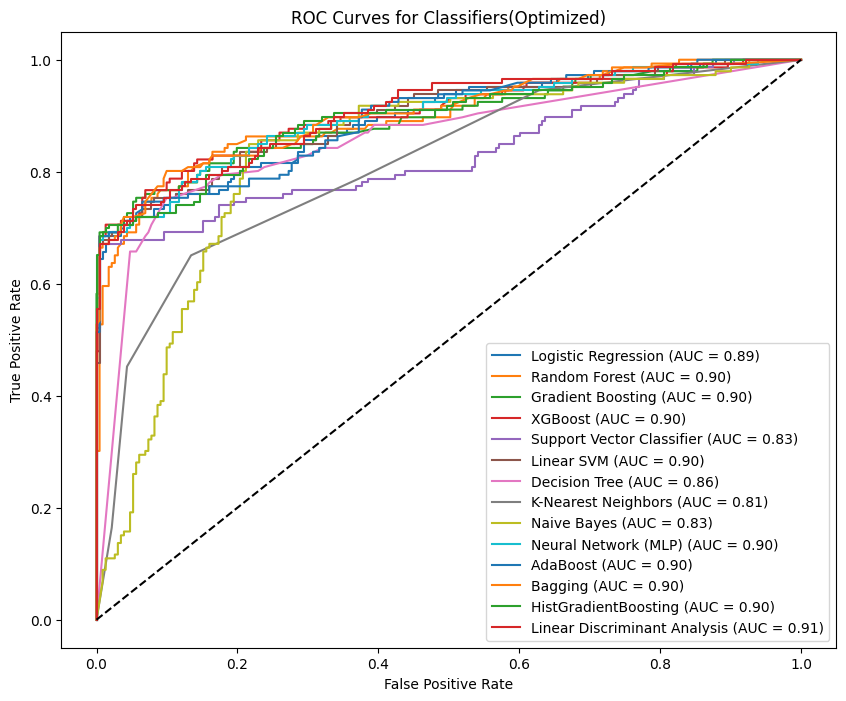

In [41]:
### AUC for best_classifiers from optimization
plt.figure(figsize=(10, 8))

for name, clf in best_classifiers.items():
    clf.fit(X_train, y_train)
    if hasattr(clf, "predict_proba"):
        y_score = clf.predict_proba(X_test)[:, 1]
    else:
        y_score = clf.decision_function(X_test)

    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for Classifiers(Optimized)')
plt.legend(loc='lower right')
plt.show()

In [42]:
### this is dictionary to store models and results
models = {}
accuracy_results = {}

### Lasso (L1) Regularization
models['Lasso'] = LogisticRegressionCV(
    Cs=10, cv=5, penalty='l1', solver='saga', random_state=42, max_iter=10000
)
models['Lasso'].fit(X_train, y_train)
y_pred = models['Lasso'].predict(X_test)
accuracy_results['Lasso'] = accuracy_score(y_test, y_pred)

### Ridge (L2) Regularization
models['Ridge'] = LogisticRegressionCV(
    Cs=10, cv=5, penalty='l2', solver='lbfgs', random_state=42, max_iter=10000
)
models['Ridge'].fit(X_train, y_train)
y_pred = models['Ridge'].predict(X_test)
accuracy_results['Ridge'] = accuracy_score(y_test, y_pred)

### elastic net regularization - combination of L1 and L2
models['Elastic Net'] = LogisticRegressionCV(
    Cs=10, cv=5, penalty='elasticnet', solver='saga', l1_ratios=[0.5], random_state=42, max_iter=10000
)
models['Elastic Net'].fit(X_train, y_train)
y_pred = models['Elastic Net'].predict(X_test)
accuracy_results['Elastic Net'] = accuracy_score(y_test, y_pred)

### print accuracy
print("Accuracy Results:")
for model_name, accuracy in accuracy_results.items():
    print(f"{model_name}: {accuracy:.4f}")

Accuracy Results:
Lasso: 0.8674
Ridge: 0.8541
Elastic Net: 0.8621


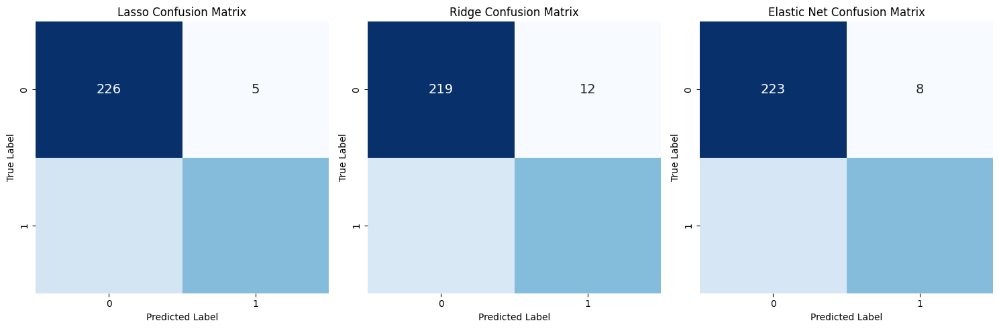

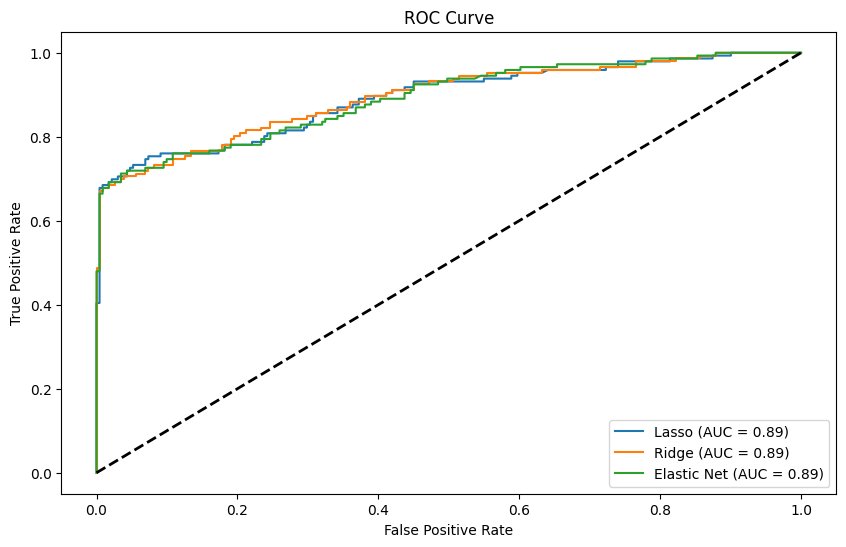

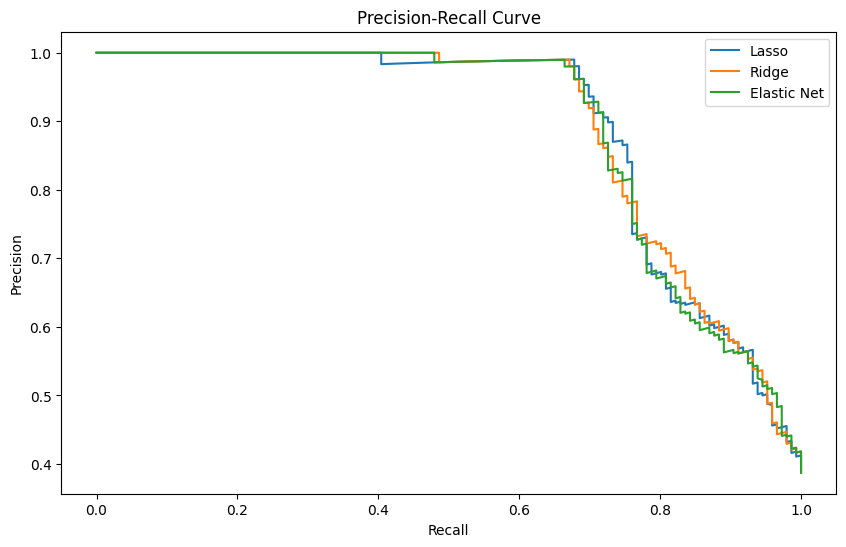

In [43]:
### Confusion Matrices for regualized models
plt.figure(figsize=(15, 5))
for i, (model_name, model) in enumerate(models.items(), 1):
    y_pred = model.predict(X_test)
    conf_matrix = confusion_matrix(y_test, y_pred)


    plt.subplot(1, 3, i)
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, annot_kws={"size": 14})
    plt.title(f"{model_name} Confusion Matrix")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.tight_layout()

plt.show()

###  ROC Curve for regualized models
plt.figure(figsize=(10, 6))
for model_name, model in models.items():
    y_pred_prob = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"{model_name} (AUC = {roc_auc:.2f})")

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.title("ROC Curve")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.show()

### Precision-Recall Curve for regualized models
plt.figure(figsize=(10, 6))
for model_name, model in models.items():
    y_pred_prob = model.predict_proba(X_test)[:, 1]
    precision, recall, _ = precision_recall_curve(y_test, y_pred_prob)
    plt.plot(recall, precision, label=f"{model_name}")

plt.title("Precision-Recall Curve")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend(loc="upper right")
plt.show()

## Theoretical Exploration 

### Variable Importance 

In [73]:
### Hyperparameters - this grid search optimization improved random forest in optimization section above
### So I am using it here
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_features': ['auto', 'sqrt'],
    'max_depth': [10, 50, 100, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

rf = RandomForestClassifier(random_state=42)


rf_grid = GridSearchCV(estimator=rf, param_grid=param_grid,
                       cv=3, verbose=2, n_jobs=-1)

rf_grid.fit(X_train, y_train)


print("Best Parameters:", rf_grid.best_params_)


y_pred = rf_grid.best_estimator_.predict(X_test)
print(classification_report(y_test, y_pred))

Fitting 3 folds for each of 432 candidates, totalling 1296 fits
Best Parameters: {'bootstrap': True, 'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 100}
              precision    recall  f1-score   support

         0.0       0.81      0.95      0.87       186
         1.0       0.89      0.64      0.74       116

    accuracy                           0.83       302
   macro avg       0.85      0.79      0.81       302
weighted avg       0.84      0.83      0.82       302



/Users/namigabbasov/anaconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:516: FitFailedWarning: 
648 fits failed out of a total of 1296.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
432 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/namigabbasov/anaconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py", line 859, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/namigabbasov/anaconda3/lib/python3.11/site-packages/sklearn/base.py", line 1358, in wrapper
    estimator._validate_params()
  File "/Users/namigabbasov/anaconda3/lib/python3.11/site-packages/sklearn/base.py", line 471, in _validate_params
    validate_parame

In [74]:
### Extract feature importance from model
feature_importances = rf_grid.best_estimator_.feature_importances_


X_train_df = pd.DataFrame(X_train, columns=X.columns)


importance_df = pd.DataFrame({
    'Feature': X_train_df.columns,
    'Importance': feature_importances
})

### Sort df by importance scores
importance_df = importance_df.sort_values(by='Importance', ascending=False)

In [82]:
import joblib

joblib.dump(rf_grid.best_estimator_, "rf_feature_model.joblib")
print("Saved rf_feature_model.joblib")


Saved rf_feature_model.joblib


In [83]:
import json

with open("feature_names.json", "w") as f:
    json.dump(list(X.columns), f)

print("Saved feature_names.json")


Saved feature_names.json


In [84]:
with open("feature_descriptions.json", "w") as f:
    json.dump(feature_descriptions, f)

print("Saved feature_descriptions.json")


Saved feature_descriptions.json


In [78]:
feature_descriptions= {
    "ter": "Conflict Type: Territory",
    "gov": "Conflict Type: Government",
    "inter": "Interstate Conflict",
    "inter_intra": "Mixed Conflict",
    "intra": "Intrastate Conflict",
    "stage_cea": "Stage: Ceasefire",
    "stage_pre": "Stage: Pre-negotiation",
    "stage_ren": "Stage: Renewal",
    "stage_subcomp": "Stage: Comprehensive",
    "stage_subpar": "Stage: Partial",
    "GRa": "Groups: Racial-Ethnic groups",
    "GRe": "Groups: Religious Groups",
    "GRef": "Groups: Refugees-Displaced Persons",
    "GeWom": "Gender: Women",
    "Pol": "Governance: Political Institutions",
    "Ele": "Governance: Elections",
    "ConGen": "Governance: Constitutional Modification",
    "ps": "Powersharing",
    "HrCp": "Human Rights: Civil and Political",
    "HrDem": "Human Rights: Democracy",
    "Prot": "Human Rights: Protections",
    "JusCr": "Justice Reform: Criminal",
    "JusJu": "Justice Reform: Judiciary and Courts",
    "Dev": "Reconstruction: Development",
    "IntFu": "Reconstruction: International Funds",
    "SsrGua": "Security: Guarantees",
    "Ce": "Security: Ceasefire",
    "SsrPol": "Security: Police",
    "SsrArm": "Security: Armed Forces",
    "SsrDdr": "Security: Demilitarisation, Disarmament, Demobilisation",
    "SsrPsf": "Security: Rebel Forces",
    "SsrFf": "Security: Withdrawal of Foreign Forces",
    "TjAm": "Transitional Justice: Amnesty",
    "TjPrire": "Transitional Justice: Prisoner Release",
    "TjRep": "Transitional Justice: Reparations",
    "TjNR": "Transitional Justice: Reconciliation",
    "ImUN": "Implementation: UN Signatory",
    "ImPK": "Implementation: International Mission",
    "ImE": "Implementation: Enforcement Mechanism",
}

In [48]:
len(feature_descriptions)

39

In [79]:
importance_df['Description'] = importance_df['Feature'].map(feature_descriptions)

In [80]:
importance_df['Description']

6                                Stage: Pre-negotiation
5                                      Stage: Ceasefire
9                                        Stage: Partial
3                                        Mixed Conflict
26                                  Security: Ceasefire
8                                  Stage: Comprehensive
14                   Governance: Political Institutions
7                                        Stage: Renewal
15                                Governance: Elections
25                                 Security: Guarantees
38                Implementation: Enforcement Mechanism
24                  Reconstruction: International Funds
30                               Security: Rebel Forces
27                                     Security: Police
31               Security: Withdrawal of Foreign Forces
11                             Groups: Religious Groups
4                                   Intrastate Conflict
28                               Security: Armed

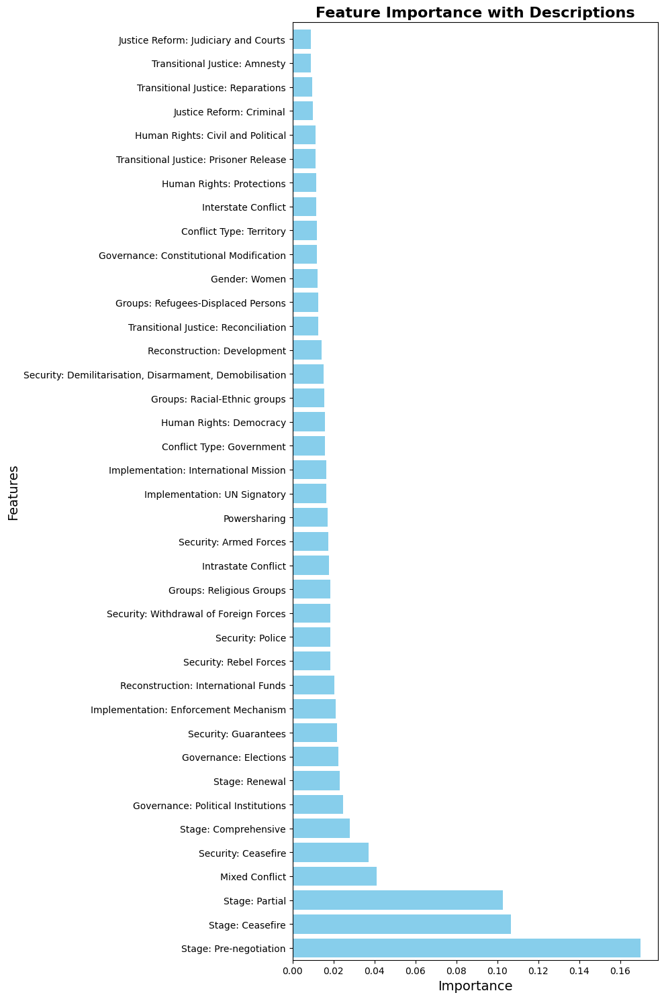

In [81]:
plt.figure(figsize=(10, 15))
plt.barh(importance_df['Description'], importance_df['Importance'], align='center', color='skyblue')
plt.title('Feature Importance with Descriptions', fontsize=16, fontweight='bold')
plt.xlabel('Importance', fontsize=14)
plt.ylabel('Features', fontsize=14)
plt.ylim(-0.5, len(importance_df['Description']) - 0.3)
plt.tight_layout()
plt.show()

In [85]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import joblib
import json

# ----------------------------------------------------------
# 1. PREPARE DATA
# ----------------------------------------------------------

y = pax_clean["end"]

X = pax_clean[[
    "ter","gov","inter","inter_intra","intra",
    "stage_cea","stage_pre","stage_ren","stage_subcomp","stage_subpar",
    "GRa","GRe","GRef","GeWom",
    "Pol","Ele","ConGen","ps",
    "HrCp","HrDem","Prot",
    "JusCr","JusJu",
    "Dev","IntFu",
    "SsrGua","Ce","SsrPol","SsrArm","SsrDdr","SsrPsf","SsrFf",
    "TjAm","TjPrire","TjRep","TjNR",
    "ImUN","ImPK","ImE"
]]

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

print("Training set:", X_train.shape, "Test set:", X_test.shape)

# ----------------------------------------------------------
# 2. TRAIN RANDOM FOREST WITH BEST PARAMS
# ----------------------------------------------------------

best_params = {
    'bootstrap': True,
    'max_depth': 10,
    'max_features': 'sqrt',
    'min_samples_leaf': 1,
    'min_samples_split': 5,
    'n_estimators': 300
}

rf = RandomForestClassifier(
    random_state=42,
    **best_params
)

rf.fit(X_train, y_train)

# ----------------------------------------------------------
# 3. EVALUATE
# ----------------------------------------------------------

y_pred = rf.predict(X_test)
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# ----------------------------------------------------------
# 4. SAVE MODEL + METADATA
# ----------------------------------------------------------

joblib.dump(rf, "rf_feature_model.joblib")
print("Saved rf_feature_model.joblib")

# Save feature names
with open("feature_names.json", "w") as f:
    json.dump(list(X.columns), f)

print("Saved feature_names.json")

# Save nice descriptions
feature_descriptions = {
    "ter": "Conflict Type: Territory",
    "gov": "Conflict Type: Government",
    "inter": "Interstate Conflict",
    "inter_intra": "Mixed Conflict",
    "intra": "Intrastate Conflict",
    "stage_cea": "Stage: Ceasefire",
    "stage_pre": "Stage: Pre-negotiation",
    "stage_ren": "Stage: Renewal",
    "stage_subcomp": "Stage: Comprehensive",
    "stage_subpar": "Stage: Partial",
    "GRa": "Racial/Ethnic Groups Included",
    "GRe": "Religious Groups Included",
    "GRef": "Refugees/Displaced Persons Included",
    "GeWom": "Women Included",
    "Pol": "Political Institutions",
    "Ele": "Elections",
    "ConGen": "Constitutional Reform",
    "ps": "Powersharing",
    "HrCp": "Civil and Political Rights",
    "HrDem": "Democracy Provisions",
    "Prot": "Human Rights Protections",
    "JusCr": "Criminal Justice Reform",
    "JusJu": "Judicial/Court Reform",
    "Dev": "Development",
    "IntFu": "International Funding",
    "SsrGua": "Security Guarantees",
    "Ce": "Ceasefire",
    "SsrPol": "Police Reform",
    "SsrArm": "Armed Forces Reform",
    "SsrDdr": "Disarmament, Demobilisation, Reintegration",
    "SsrPsf": "Rebel Forces",
    "SsrFf": "Withdrawal of Foreign Forces",
    "TjAm": "Amnesty",
    "TjPrire": "Prisoner Release",
    "TjRep": "Reparations",
    "TjNR": "Reconciliation",
    "ImUN": "UN as Signatory",
    "ImPK": "International Mission",
    "ImE": "Enforcement Mechanism"
}

with open("feature_descriptions.json", "w") as f:
    json.dump(feature_descriptions, f)

print("Saved feature_descriptions.json")

Training set: (1206, 39) Test set: (302, 39)

Classification Report:
              precision    recall  f1-score   support

         0.0       0.82      0.95      0.88       186
         1.0       0.89      0.66      0.76       116

    accuracy                           0.84       302
   macro avg       0.85      0.80      0.82       302
weighted avg       0.85      0.84      0.83       302

Saved rf_feature_model.joblib
Saved feature_names.json
Saved feature_descriptions.json


Final SHAP shape: (302, 39)
Final X_test_np shape: (302, 39)


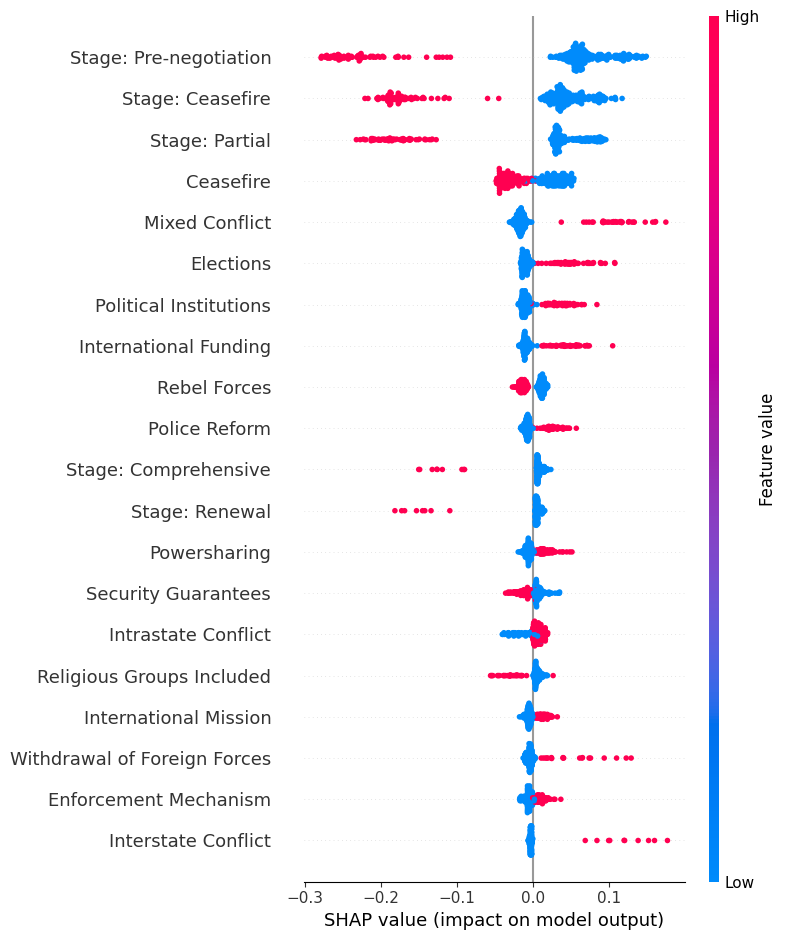

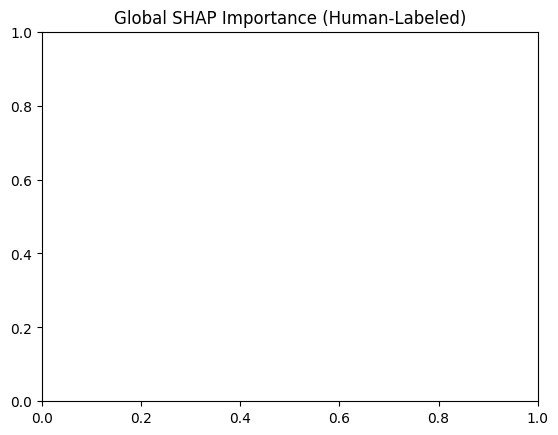

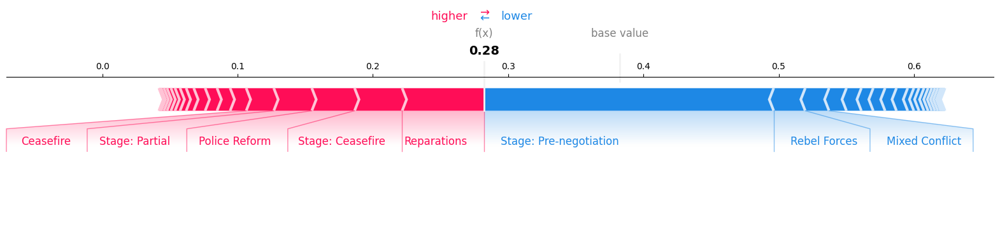

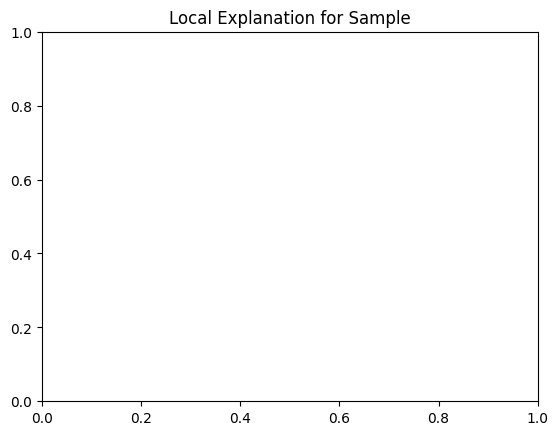

[CV] END bootstrap=True, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.0s
[CV] END bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   1.3s
[CV] END bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.6s
[CV] END bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.7s
[CV] END bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time=   1.1s
[CV] END bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time=   1.0s
[CV] END bootstrap=True, max_depth=50, max_feat

In [89]:
import shap
import numpy as np
import joblib
import json
import pandas as pd
import matplotlib.pyplot as plt

# Load RF model
rf = joblib.load("rf_feature_model.joblib")

# Load metadata
with open("feature_names.json","r") as f:
    feature_names = json.load(f)

with open("feature_descriptions.json","r") as f:
    feature_desc = json.load(f)

# Create human-readable ordered labels
human_labels = [feature_desc[f] for f in feature_names]

# Ensure X_test_df exists
X_test_df = pd.DataFrame(X_test, columns=feature_names)
X_test_np = X_test_df.values

# SHAP TreeExplainer
explainer = shap.TreeExplainer(rf)

# Compute shap values
sv_raw = explainer.shap_values(X_test_np)

# Normalize format (list vs 3D array)
if isinstance(sv_raw, list):
    sv = sv_raw[1]  # class = 1 (success)
else:
    arr = np.array(sv_raw)
    if arr.ndim == 3:
        sv = arr[:,:,1]
    else:
        sv = arr

print("Final SHAP shape:", sv.shape)
print("Final X_test_np shape:", X_test_np.shape)

shap.summary_plot(
    sv, 
    X_test_np,
    feature_names=human_labels  # <===== HUMAN LABELS HERE
)
plt.title("Global SHAP Importance (Human-Labeled)")
plt.show()

i = 0  # any index from 0 to len(X_test_df)

shap.force_plot(
    explainer.expected_value[1],
    sv[i],
    human_labels,    
    matplotlib=True
)
plt.title("Local Explanation for Sample")
plt.show()

### Statistical Inference 

In [ ]:
pax.loc[pax['conflict_id'].notna() & pax['ep_end'].isna(), 'ep_end'] = 1
pax["ep_end"].isna().sum()

In [ ]:
pax_cleaned = pax.dropna(subset=["ep_end"])
y_origin = pax_cleaned["ep_end"]
X_origin = pax_cleaned[features]

In [ ]:
X_origin= sm.add_constant(X_origin)
model = sm.Logit(y_origin, X_origin)
result = model.fit()

In [ ]:
result.summary()

In [ ]:
vif_data = pd.DataFrame({
    'Feature': X_origin.columns,
    'VIF': [variance_inflation_factor(X_origin.values, i) for i in range(X_origin.shape[1])]
})
vif_data

In [ ]:
### extract coefficients(parameters) and confidence intervals(95percent)
coefficients= result.params
conf_int= result.conf_int()
conf_int.columns = ['2.5%', '97.5%']
conf_int['Coefficient'] = coefficients

### add labels
conf_int['Feature'] = [feature_descriptions.get(feature, feature) for feature in X_origin.columns]

### sorting for better viz
conf_int= conf_int.sort_values(by='Coefficient', ascending=True)


plt.figure(figsize=(10, 12))
plt.errorbar(
    conf_int['Coefficient'], conf_int['Feature'],
    xerr=[conf_int['Coefficient'] - conf_int['2.5%'],
          conf_int['97.5%'] - conf_int['Coefficient']],
    fmt='o', color='blue', ecolor='gray', capsize=5, label='95% CI'
)
plt.axvline(x=0, color='red', linestyle='--')  # Reference line at 0
plt.title('Logistic Regression Coefficients with 95% Confidence Intervals')
plt.xlabel('Coefficient Value')
plt.ylabel('Feature Description')
plt.tight_layout()
plt.legend()
plt.show()

## Text Classification with Machine Learning 

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_auc_score
from scipy.sparse import hstack

# Preprocess text data
def preprocess_text(text):
    """Basic text preprocessing."""
    import re
    from nltk.corpus import stopwords

    stop_words = set(stopwords.words('english'))
    text = re.sub(r'\W', ' ', text)  # Remove non-alphanumeric characters
    text = re.sub(r'\s+', ' ', text)  # Remove extra whitespace
    text = re.sub(r'\d', '', text)  # Remove digits
    text = text.lower()  # Convert to lowercase
    text = ' '.join(word for word in text.split() if word not in stop_words)  # Remove stopwords
    return text

# Work on a copy of the dataset
ml= pax_clean.copy()

# Apply text preprocessing
ml['text_clean'] = ml['text'].fillna('').apply(preprocess_text)

# Define target variable
y_text = ml['end']

# Text vectorization using TF-IDF
tfidf = TfidfVectorizer(max_features=5000, ngram_range=(1, 2))
X_text = tfidf.fit_transform(ml['text_clean'])

# Train-test split
X_train_text, X_test_text, y_train_text, y_test_text = train_test_split(
    X_text, y_text, test_size=0.3, random_state=42, stratify=y_text
)

# Train Random Forest Classifier
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train_text, y_train_text)

# Make predictions
y_pred = rf_model.predict(X_test_text)
y_pred_proba = rf_model.predict_proba(X_test_text)[:, 1]

# Evaluate model
print("\nClassification Report:")
print(classification_report(y_test_text, y_pred))

print("\nConfusion Matrix:")
print(confusion_matrix(y_test_text, y_pred))

print("\nAccuracy:", accuracy_score(y_test_text, y_pred))
print("ROC-AUC Score:", roc_auc_score(y_test_text, y_pred_proba))


In [ ]:
# Dictionary of classifiers (without Linear Discriminant Analysis)
classifiers = {
    'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'XGBoost': XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42),
    'Support Vector Classifier': SVC(kernel='rbf', random_state=42, gamma='scale', C=1.0),
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'K-Nearest Neighbors': KNeighborsClassifier(),
    'Naive Bayes': GaussianNB(),
    'Neural Network (MLP)': MLPClassifier(random_state=42, max_iter=1000),
    'AdaBoost': AdaBoostClassifier(random_state=42),
    'Bagging': BaggingClassifier(random_state=42),
    'HistGradientBoosting': HistGradientBoostingClassifier(random_state=42)
}

# Initialize results dictionary
metrics_results = {
    "Classifier": [],
    "Accuracy": [],
    "Precision": [],
    "Recall": [],
    "F1-Score": []
}

# Loop through classifiers, train, predict, and evaluate
for name, clf in classifiers.items():
    print(f'\nTraining {name}')
    
    # Convert sparse to dense for specific classifiers
    if name in ['Naive Bayes', 'HistGradientBoosting']:
        clf.fit(X_train_text.toarray(), y_train_text)
        y_pred = clf.predict(X_test_text.toarray())
    else:
        clf.fit(X_train_text, y_train_text)
        y_pred = clf.predict(X_test_text)
    
    # Calculate metrics
    accuracy = accuracy_score(y_test_text, y_pred)
    precision = precision_score(y_test_text, y_pred, zero_division=0)
    recall = recall_score(y_test_text, y_pred, zero_division=0)
    f1 = f1_score(y_test_text, y_pred, zero_division=0)
    
    # Append metrics to results dictionary
    metrics_results["Classifier"].append(name)
    metrics_results["Accuracy"].append(accuracy)
    metrics_results["Precision"].append(precision)
    metrics_results["Recall"].append(recall)
    metrics_results["F1-Score"].append(f1)

    # Print metrics for each model
    print(f'\n{name} Results:')
    print(f'Accuracy: {accuracy:.2f}')
    print(f'Precision: {precision:.2f}')
    print(f'Recall: {recall:.2f}')
    print(f'F1-Score: {f1:.2f}')

# Convert metrics to DataFrame
metrics_df = pd.DataFrame(metrics_results).set_index("Classifier")

# Plot heatmap of metrics
plt.figure(figsize=(12, 8), dpi=600)
sns.heatmap(metrics_df, annot=True, fmt=".2f", cmap="Blues", cbar=True)
plt.title('Performance Metrics for Classifiers')
plt.xlabel('Metrics')
plt.ylabel('Classifier')
plt.tight_layout()
plt.show()

[CV] END bootstrap=True, max_depth=100, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   0.0s
[CV] END bootstrap=True, max_depth=100, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=100, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=100, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=100, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.0s
[CV] END bootstrap=True, max_depth=100, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=100, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=10